In [67]:
import numpy as np
import numpy.linalg as la
from scipy import spatial
import matplotlib.pyplot as plt
from math import *
import time

%matplotlib inline

$$
T(x) =  \begin{pmatrix} a_0 + (1+a_2) x_0 + a_3 x_1 + a_5 a_6^2 (x_0+a_7) e^{-0.5 a_6^2((x_0+a_7)^2 + (x_1+a_8^2))} \\ a_1 + (1+a_4) x_1 + a_3 x_0 + a_5 a_6^2 (x_1+a_8) e^{-0.5 a_6^2((x_0+a_7)^2 + (x_1+a_8^2))} \end{pmatrix}\\
 = T_0(x) + T_1(x)
$$
and  
$$
g(z) =b_0 + b_1 z_0 + b_2 z_1 + 0.5 b_3 z_0^2 + b_4 z_0z_1 + 0.5 B_5 z_1^2 + \beta_6 \exp \left( -\frac{1}{2}\beta_7^2((z_0+b_8)^2 + (z_1+b_9)^2) \right) + \beta_{10} \exp \left( -\frac{1}{2}\beta_{11}^2((z_0+b_{12})^2 + (z_1+b_{13})^2) \right) \\
 = g_0(z) + g_1(z) + g_2(z)
$$

Penalization:
$a_6,b_7, b_{10}$ penalized as $e^{\epsilon^2 \sigma^2 } - 1/(D^2 \sigma^2)$

$a_7,a_8,b_8,b_9,b_{12},b_{13}$ penalized as $m^2/(10 D^2)$
where $D$ is an estimate of the size of the support of the data (e.g. std), $\epsilon = \max_i \min_j |x_i-y_j|$

# Data samples

In [87]:
d = 2
Nx = 200
Ny = 400

# #Guassians
# mx = np.array([0,0])
# sx = np.array([[1.0,0.0],[0.0,1.0]])
# my = np.array([5,5])
# sy = np.array([[9.0,0.0],[0.0,9.0]])
# x = np.random.multivariate_normal(mx,sx,Nx)
# y = np.random.multivariate_normal(my,sy,Ny)

#Gaussian to mixed Gaussian
mx = np.array([0,0])
sx = np.array([[1.0,0.0],[0.0,1.0]])
my1 = np.array([4,0])
sy1 = np.array([[1.0,0.0],[0.0,1.0]])
my2 = np.array([-4,1])
sy2 = np.array([[1.0,0.0],[0.0,1.0]])
x = np.random.multivariate_normal(mx,sx,Nx)
y1 = np.random.multivariate_normal(my1,sy1,Ny)
y2 = np.random.multivariate_normal(my2,sy2,Ny)
y = np.concatenate([y1,y2],axis=0)

# #Gaussian to compressed gaussian
# mx = np.array([0,0])
# sx = np.array([[1.0,0.0],[0.0,1.0]])
# x = np.random.multivariate_normal(mx,sx,Nx)
# z = np.random.multivariate_normal(np.array([1,1]),sx,Ny)
# y = np.einsum('i,ij->ij',np.tanh(0.5*la.norm(z,axis=1)),z)

#Gaussian to annulus
mx = np.array([-2,0])
sx = np.array([[1.0,0.0],[0.0,1.0]])
x = np.random.multivariate_normal(mx,sx,Nx)
r = 2*np.sqrt(np.random.uniform(0.8,1,Ny))
theta = 2*pi*np.random.uniform(0,1,Ny)
y = np.zeros((Ny,2))
y[:,0]=r*np.cos(theta)
y[:,1]=r*np.sin(theta)

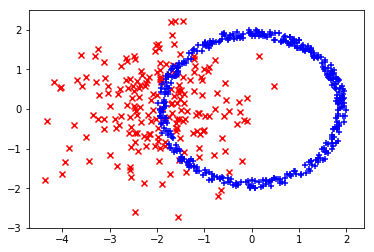

In [88]:
plt.scatter(x[:,0],x[:,1], color='red', marker = 'x');
plt.scatter(y[:,0],y[:,1], color='blue', marker = '+');

# Local Algorithm

## GH

### Test GH

In [31]:
d = 2
Ny = len(y)
da = 9
db = 14

####DEBUG##############
a = np.random.uniform(0.0,1.0,da)
b = np.random.uniform(0.0,1.0,db)
eps = 0.1
D = 1
#######################


#Precomputed data, (twisted) gradient and Hessian
# xh = np.concatenate([x.reshape(Nx,d),np.ones((Nx,d))],axis=1)

gammaA = 2*1e-1 #alpha regularization parameter 
gammaB = 2*1e-1 #beta regularization parameter

#precomputations
x0 = x[:,0]
x1 = x[:,1]
x0a7 = x0+a[7]
x1a8 = x1+a[8]
argexpT = a[6]**2*(x0a7**2+x1a8**2)
expT = np.exp(-0.5*argexpT)
T = np.zeros((Nx,2))
T[:,0] = a[0] + a[2]*x0+a[3]*x1+a[5]*a[6]**2 * x0a7*expT
T[:,1] = a[1] + a[3]*x0+a[4]*x1+a[5]*a[6]**2 * x1a8*expT
T0 = T[:,0]
T1 = T[:,1]
y0 = y[:,0]
y1 = y[:,1]
g0y = b[0]+ b[1]*y0+b[2]*y1+0.5*b[3]*y0**2+b[4]*y0*y1+0.5*b[5]*y1**2
y0b8 = y0+b[8]
y1b9 = y1+b[9]
y0b12 = y0+b[12]
y1b13 = y1+b[13]
argexpy1 =  b[7]**2*(y0b8**2+y1b9**2)
expy1 = np.exp(-0.5*argexpy1)
argexpy2 =  b[11]**2*(y0b12**2+y1b13**2)
expy2 = np.exp(-0.5*argexpy2)
g1y = b[6]*expy1
g2y = b[10]*expy2
gy = g0y + g1y + g2y
g0T =b[0]+ b[1]*T0+b[2]*T1+0.5*b[3]*T0**2+b[4]*T0*T1+0.5*b[5]*T1**2
T0b8 = T0+b[8]
T1b9 = T1+b[9]
T0b12 = T0+b[12]
T1b13 = T1+b[13]
argexpT1 =  b[7]**2*(T0b8**2+T1b9**2)
expT1 = np.exp(-0.5*argexpT1)
argexpT2 =  b[11]**2*(T0b12**2+T1b13**2)
expT2 = np.exp(-0.5*argexpT2)
g1T = b[6]*expT1
g2T = b[10]*expT2
gT = g0T + g1T + g2T   

#first derivatives
gzT = np.zeros((Nx,2))
gzT[:,0] = b[1]+b[3]*T0+b[4]*T1
gzT[:,0] += -b[6]*b[7]**2*T0b8*expT1
gzT[:,0] += -b[10]*b[11]**2*T0b12*expT2
gzT[:,1] = b[2]+b[4]*T0+b[5]*T1
gzT[:,1] += -b[6]*b[7]**2*T1b9*expT1
gzT[:,1] += -b[10]*b[11]**2*T1b13*expT2

daT = np.zeros((Nx,da,d))
daT[:,0,:] = np.array([1,0])
daT[:,1,:] = np.array([0,1])
daT[:,2,0] = 0.5*x0**2
daT[:,3,0] = x1
daT[:,3,1] = x0
daT[:,4,1] = 0.5*x1**2
daT[:,5,0] = expT*a[6]**2*x0a7
daT[:,5,1] = expT*a[6]**2*x1a8
daT[:,6,0] = a[5]*a[6]*expT*x0a7*(2-argexpT)
daT[:,6,1] = a[5]*a[6]*expT*x1a8*(2-argexpT)
daT[:,7,0] = a[5]*a[6]*expT*(1-a[6]**2*x0a7**2)
daT[:,7,1] = -a[5]*a[6]*expT*a[6]**2*x0a7*x1a8
daT[:,8,0] = daT[:,7,1]
daT[:,8,1] = a[5]*a[6]*expT*(1-a[6]**2*x1a8**2)

#gradient w.r.t. a
penalty_a = np.zeros(da)
penalty_a[6] = a[6]*eps**2*np.exp(eps**2*a[6]**2) - 1.0/(D**2 * a[6]**3)
penalty_a[7] = a[7] * 1.0/(10*D**2)
penalty_a[8] = a[8] * 1.0/(10*D**2)
daL = (1.0/Nx) * np.einsum('ijk,ik->j',daT,gpTx) + gammaA*(0.00+(1/(2*Nx))*la.norm(gzT))*penalty_a

expgy = np.exp(gy)
dbgy = np.zeros((Ny,db))
dbgT = np.zeros((Nx,db))
dbgy[:,0] = np.ones(Ny)
dbgT[:,0] = np.ones(Nx)
dbgy[:,1] = y0
dbgT[:,1] = T0
dbgy[:,2] = y1
dbgT[:,2] = T1
dbgy[:,3] = 0.5*y0**2
dbgT[:,3] = 0.5*T0**2
dbgy[:,4] = y0*y1
dbgT[:,4] = T0*T1
dbgy[:,5] = 0.5*y1**2
dbgT[:,5] = 0.5*T1**2
dbgy[:,6] = expy1
dbgT[:,6] = expT1
dbgy[:,7] = -b[6]*b[7]*argexpy1*expy1
dbgT[:,7] = -b[6]*b[7]*argexpT1*expT1
dbgy[:,8] = -b[6]*b[7]**2*y0b8*expy1
dbgT[:,8] = -b[6]*b[7]**2*T0b8*expT1
dbgy[:,9] = -b[6]*b[7]**2*y1b9*expy1
dbgT[:,9] = -b[6]*b[7]**2*T1b9*expT1
dbgy[:,10] = expy2
dbgT[:,10] = expT2
dbgy[:,11] = -b[10]*b[11]*argexpy2*expy2
dbgT[:,11] = -b[10]*b[11]*argexpT2*expT2
dbgy[:,12] = -b[10]*b[11]**2*y0b12*expy2
dbgT[:,12] = -b[10]*b[11]**2*T0b12*expT2
dbgy[:,13] = -b[10]*b[11]**2*y1b13*expy2
dbgT[:,13] = -b[10]*b[11]**2*T1b13*expT2
#gradient w.r.t. b
penalty_b = np.zeros(db)
penalty_b[7] = b[7]*eps**2 * np.exp(eps**2 * b[7]**2) - 1.0/(D**2 * b[7]**3)
penalty_b[11] = b[11]*eps**2 * np.exp(eps**2 * b[11]**2) - 1.0/(D**2 * b[11]**3)
penalty_b[8] = b[8] * 1.0/(10*D**2)
penalty_b[9] = b[9] * 1.0/(10*D**2)
penalty_b[12] = b[12] * 1.0/(10*D**2)
penalty_b[13] = b[13] * 1.0/(10*D**2)
dbL = (1.0/Nx)*np.sum(dbgT,axis=0) - (1.0/Ny)*np.einsum('ik,i->k',dbgy,expgy) - gammaB*penalty_b

#twisted gradient
G = np.concatenate([daL,-dbL],axis=0)

#Second derivatives
gzzT = np.zeros((Nx,d,d))
gzzT[:,0,0] = b[3] - b[6]*b[7]**2*(1-b[7]**2*T0b8**2)*expT1-b[10]*b[11]**2*(1-b[11]**2*T0b12**2)*expT2
gzzT[:,1,0] = b[4] - b[6]*b[7]**2*(1-b[7]**2*T0b8*T1b9)*expT1-b[10]*b[11]**2*(1-b[11]**2*T0b12*T1b13)*expT2
gzzT[:,0,1] = gzzT[:,1,0]
gzzT[:,1,1] = b[5] - b[6]*b[7]**2*(1-b[7]**2*T1b9**2)*expT1-b[10]*b[11]**2*(1-b[11]**2*T1b13**2)*expT2

daaT = np.zeros((Nx,da,da,d))
daaT[:,5,6,0] = a[6]*x0a7*expT*(2-argexpT)
daaT[:,6,5,0] = daaT[:,5,6,0]
daaT[:,5,6,1] = a[6]*x1a8*expT*(2-argexpT)
daaT[:,6,5,1] = daaT[:,5,6,1]
daaT[:,5,7,0] = a[6]**2*expT*(1-a[6]**2*x0a7**2)
daaT[:,7,5,0] = daaT[:,5,7,0]
daaT[:,5,7,1] = -a[6]**4*expT*x0a7*x1a8
daaT[:,7,5,1] = daaT[:,5,7,1]
daaT[:,5,8,0] = daaT[:,5,7,1]
daaT[:,8,5,0] = daaT[:,5,7,1]
daaT[:,5,8,1] = a[6]**2*expT*(1-a[6]**2*x1a8**2)
daaT[:,5,8,1] = daaT[:,8,5,1]
daaT[:,6,6,0] = a[5]*x0a7*expT*(2-3*argexpT-(2-argexpT)*argexpT)
daaT[:,6,6,1] = a[5]*x1a8*expT*(2-3*argexpT-(2-argexpT)*argexpT)
daaT[:,6,7,0] = a[5]*a[6]*expT*(2-a[6]**2*(3*x0a7**2+x1a8**2)-x0a7**2*a[6]**2*(2-argexpT))
daaT[:,6,7,1] = -a[5]*expT*(x1a8)*a[6]**3*x0a7*(4-argexpT)
daaT[:,7,6,0] = daaT[:,6,7,0]
daaT[:,7,6,1] = daaT[:,6,7,1]
daaT[:,6,8,0] = daaT[:,6,7,1]
daaT[:,8,6,0] = daaT[:,6,7,1]
daaT[:,6,8,1] = a[5]*a[6]*expT*(2-a[6]**2*(3*x1a8**2+x0a7**2)-x1a8**2*a[6]**2*(2-argexpT))
daaT[:,8,6,1] = daaT[:,6,8,1]
daaT[:,7,7,0] = -a[5]*a[6]**4*expT*x0a7*(3-x0a7**2*a[6]**2)
daaT[:,7,7,1] = -a[5]*a[6]**4*x1a8*expT*(1-a[6]**2*x0a7**2)
daaT[:,7,8,0] = daaT[:,7,7,1]
daaT[:,8,7,0] = daaT[:,7,7,1]
daaT[:,7,8,1] = -a[5]*a[6]**4*expT*x0a7*(1-a[6]**2*x1a8**2)
daaT[:,8,7,1] = daaT[:,7,8,1]
daaT[:,8,8,0] = -a[5]*a[6]**4*x0a7*expT*(1-a[6]**2*x1a8**2)
daaT[:,8,8,1] = -a[5]*a[6]**4*expT*x1a8*(3-x1a8**2*a[6]**2)
#Hessian w.r.t. aa
penaltyH_a = np.zeros((da,da))
penaltyH_a[6,6] = eps**2 * np.exp((a[6]*eps)**2)*(1.0+2.0*a[6]**2*eps**2) + 3/(D**2 * a[6]**4)
penaltyH_a[7,7] = 1*1.0/(10*D**2)
penaltyH_a[8,8] = 1*1.0/(10*D**2)
daaL = (1.0/Nx)*(np.einsum('ijkl,il->jk',daaT,gzT) + np.einsum('ijl,ilm,ikm->jk',daT,gzzT,daT)) + gammaA*(0.00+(1/(2*Nx))*la.norm(gzT))*penaltyH_a

dbzgT = np.zeros((Nx,db,d))
dbzgT[:,1,0]=np.ones(Nx)
dbzgT[:,2,1]=np.ones(Nx)
dbzgT[:,3,0]=T0
dbzgT[:,4,0]=T1
dbzgT[:,4,1]=T0
dbzgT[:,5,1]=T1
dbzgT[:,6,0]=-b[6]**2*T0b8*expT1
dbzgT[:,6,1]=-b[6]**2*T1b9*expT1
dbzgT[:,7,0]=-b[6]*b[7]*expT1*T0b8*(2-argexpT1)
dbzgT[:,7,1]=-b[6]*b[7]*expT1*T1b9*(2-argexpT1)
dbzgT[:,8,0]=-b[6]*b[7]**2*expT1*(1-b[7]**2*T0b8**2)
dbzgT[:,8,1]=b[6]*b[7]**4*expT1*T0b8*T1b9
dbzgT[:,9,0]=dbzgT[:,8,1]
dbzgT[:,9,1]=-b[6]*b[7]**2*expT1*(1-b[7]**2*T1b9**2)
dbzgT[:,10,0]=-b[10]**2*T0b12*expT2
dbzgT[:,10,1]=-b[10]**2*T1b13*expT2
dbzgT[:,11,0]=-b[10]*b[11]*expT2*T0b12*(2-argexpT2)
dbzgT[:,11,1]=-b[10]*b[11]*expT2*T1b13*(2-argexpT2)
dbzgT[:,12,0]=-b[10]*b[11]**2*expT2*(1-b[11]**2*T0b12**2)
dbzgT[:,12,1]=b[10]*b[11]**4*expT2*T0b12*T1b13
dbzgT[:,13,0]=dbzgT[:,12,1]
dbzgT[:,13,1]=-b[10]*b[11]**2*expT2*(1-b[11]**2*T1b13**2)
# #Hessian w.r.t. ab
dabL = (1.0/Nx)*np.einsum('ikl,ijl->jk',dbzgT,daT)

dbbgy = np.zeros((Ny,db,db))
dbbgT = np.zeros((Nx,db,db))
dbbgy[:,6,7] = -b[7]*(y0b8**2+y1b9**2)*expy1
dbbgy[:,7,6] = dbbgy[:,6,7]
dbbgy[:,6,8] = -b[7]**2*y0b8*expy1
dbbgy[:,8,6] = dbbgy[:,6,8]
dbbgy[:,6,9] = -b[7]**2*y1b9*expy1
dbbgy[:,9,6] = dbbgy[:,6,9]
dbbgy[:,7,7] = -b[6]*(y0b8**2+y1b9**2)*expy1*(1-argexpy1)
dbbgy[:,7,8] = -b[6]*b[7]*expy1*y0b8*(2-argexpy1)
dbbgy[:,8,7] = dbbgy[:,7,8]
dbbgy[:,7,9] = -b[6]*b[7]*expy1*y1b9*(2-argexpy1)
dbbgy[:,9,7] = dbbgy[:,7,9]
dbbgy[:,8,8] = -b[6]*b[7]**2*expy1*(1-y0b8**2*b[7]**2)
dbbgy[:,8,9] = b[6]*b[7]**4*y0b8*y1b9*expy1
dbbgy[:,9,8] = dbbgy[:,8,9] 
dbbgy[:,9,9] = -b[6]*b[7]**2*expy1*(1-y1b9**2*b[7]**2)
dbbgy[:,10,11] = -b[11]*(y0b12**2+y1b13**2)*expy2
dbbgy[:,11,10] = dbbgy[:,10,11]
dbbgy[:,10,12] = -b[11]**2*y0b12*expy2
dbbgy[:,12,10] = dbbgy[:,10,12]
dbbgy[:,10,13] = -b[11]**2*y1b13*expy2
dbbgy[:,13,10] = dbbgy[:,10,13]
dbbgy[:,11,11] = -b[10]*(y0b12**2+y1b13**2)*expy2*(1-argexpy2)
dbbgy[:,11,12] = -b[10]*b[11]*expy2*y0b12*(2-argexpy2)
dbbgy[:,12,11] = dbbgy[:,11,12]
dbbgy[:,11,13] = -b[10]*b[11]*expy2*y1b13*(2-argexpy2)
dbbgy[:,13,11] = dbbgy[:,11,13]
dbbgy[:,12,12] = -b[10]*b[11]**2*expy2*(1-y0b12**2*b[11]**2)
dbbgy[:,12,13] = b[10]*b[11]**4*y0b12*y1b13*expy2
dbbgy[:,13,12] = dbbgy[:,12,13] 
dbbgy[:,13,13] = -b[10]*b[11]**2*expy2*(1-y1b13**2*b[11]**2)
dbbgT[:,6,7] = -b[7]*(T0b8**2+T1b9**2)*expT1
dbbgT[:,7,6] = dbbgT[:,6,7]
dbbgT[:,6,8] = -b[7]**2*T0b8*expT1
dbbgT[:,8,6] = dbbgT[:,6,8]
dbbgT[:,6,9] = -b[7]**2*T1b9*expT1
dbbgT[:,9,6] = dbbgT[:,6,9]
dbbgT[:,7,7] = -b[6]*(T0b8**2+T1b9**2)*expT1*(1-argexpT1)
dbbgT[:,7,8] = -b[6]*b[7]*expT1*T0b8*(2-argexpT1)
dbbgT[:,8,7] = dbbgT[:,7,8]
dbbgT[:,7,9] = -b[6]*b[7]*expT1*T1b9*(2-argexpT1)
dbbgT[:,9,7] = dbbgT[:,7,9]
dbbgT[:,8,8] = -b[6]*b[7]**2*expT1*(1-T0b8**2*b[7]**2)
dbbgT[:,8,9] = b[6]*b[7]**4*T0b8*T1b9*expT1
dbbgT[:,9,8] = dbbgT[:,8,9] 
dbbgT[:,9,9] = -b[6]*b[7]**2*expT1*(1-T1b9**2*b[7]**2)
dbbgT[:,10,11] = -b[11]*(T0b12**2+T1b13**2)*expT2
dbbgT[:,11,10] = dbbgT[:,10,11]
dbbgT[:,10,12] = -b[11]**2*T0b12*expT2
dbbgT[:,12,10] = dbbgT[:,10,12]
dbbgT[:,10,13] = -b[11]**2*T1b13*expT2
dbbgT[:,13,10] = dbbgT[:,10,13]
dbbgT[:,11,11] = -b[10]*(T0b12**2+T1b13**2)*expT2*(1-argexpT2)
dbbgT[:,11,12] = -b[10]*b[11]*expT2*T0b12*(2-argexpT2)
dbbgT[:,12,11] = dbbgT[:,11,12]
dbbgT[:,11,13] = -b[10]*b[11]*expT2*T1b13*(2-argexpT2)
dbbgT[:,13,11] = dbbgT[:,11,13]
dbbgT[:,12,12] = -b[10]*b[11]**2*expT2*(1-T0b12**2*b[11]**2)
dbbgT[:,12,13] = b[10]*b[11]**4*T0b12*T1b13*expT2
dbbgT[:,13,12] = dbbgT[:,12,13] 
dbbgT[:,13,13] = -b[10]*b[11]**2*expT2*(1-T1b13**2*b[11]**2)
# #symmetrize tensors
# dbbgy = dbbgy + np.transpose(dbbgy,(0,2,1))
# dbbgy[:,np.arange(db),np.arange(db)] *= 0.5
# dbbgT = dbbgT + np.transpose(dbbgT,(0,2,1))
# dbbgT[:,np.arange(db),np.arange(db)] *= 0.5

dbgdbg = np.einsum('jn,jm->jnm',dbgy,dbgy)
#Hessian w.r.t. bb
penaltyH_b = np.zeros((db,db))
# penaltyH_b[5,5] = 1*1.0/(10*D**2)+1*6*eps**2 *(b[5]-b[8])**(-4)
# penaltyH_b[8,8] = 1*1.0/(10*D**2)+1*6*eps**2 *(b[5]-b[8])**(-4)
# penaltyH_b[5,8] = -1*6*eps**2 *(b[5]-b[8])**(-4)
# penaltyH_b[8,5] = -1*6*eps**2 *(b[5]-b[8])**(-4)
penaltyH_b[7,7] = eps**2 * np.exp((b[7]*eps)**2)*(1.0+2.0*b[7]**2*eps**2) + 3/(D**2 * b[7]**4)
penaltyH_b[8,8] = 1*1.0/(10*D**2)
penaltyH_b[9,9] = 1*1.0/(10*D**2)
penaltyH_b[11,11] = eps**2 * np.exp((b[11]*eps)**2)*(1.0+2.0*b[11]**2*eps**2) + 3/(D**2 * b[11]**4)
penaltyH_b[12,12] = 1*1.0/(10*D**2)
penaltyH_b[13,13] = 1*1.0/(10*D**2)
dbbL = (1.0/Nx)*np.sum(dbbgT,axis=0) - (1.0/Ny)*np.einsum('jnm,j->nm',(dbbgy+dbgdbg),expgy) - gammaB*penaltyH_b

# #Twisted Hessian
H = np.zeros((da+db,da+db))
H[:da,:da] = daaL
H[:da,da:] = dabL
H[da:,:da] = -dabL.T
H[da:,da:] = -dbbL

### GH func

In [8]:
d = 2
Ny = len(y)
da = 9
db = 14

#Precomputed data, (twisted) gradient and Hessian
# xh = np.concatenate([x.reshape(Nx,d),np.ones((Nx,d))],axis=1)

gammaA = 2*1e-1 #alpha regularization parameter 
gammaB = 2*1e-1 #beta regularization parameter

def GH(a,b,eps,D):
    x0 = x[:,0]
    x1 = x[:,1]
    x0a7 = x0+a[7]
    x1a8 = x1+a[8]
    argexpT = a[6]**2*(x0a7**2+x1a8**2)
    expT = np.exp(-0.5*argexpT)
    T = np.zeros((Nx,2))
    T[:,0] = a[0] + (1+a[2])*x0+a[3]*x1+a[5]*a[6]**2 * x0a7*expT
    T[:,1] = a[1] + a[3]*x0+(1+a[4])*x1+a[5]*a[6]**2 * x1a8*expT
    T0 = T[:,0]
    T1 = T[:,1]
    y0 = y[:,0]
    y1 = y[:,1]
    g0y = b[0]+ b[1]*y0+b[2]*y1+0.5*b[3]*y0**2+b[4]*y0*y1+0.5*b[5]*y1**2
    y0b8 = y0+b[8]
    y1b9 = y1+b[9]
    y0b12 = y0+b[12]
    y1b13 = y1+b[13]
    argexpy1 =  b[7]**2*(y0b8**2+y1b9**2)
    expy1 = np.exp(-0.5*argexpy1)
    argexpy2 =  b[11]**2*(y0b12**2+y1b13**2)
    expy2 = np.exp(-0.5*argexpy2)
    g1y = b[6]*expy1
    g2y = b[10]*expy2
    gy = g0y + g1y + g2y
    g0T =b[0]+ b[1]*T0+b[2]*T1+0.5*b[3]*T0**2+b[4]*T0*T1+0.5*b[5]*T1**2
    T0b8 = T0+b[8]
    T1b9 = T1+b[9]
    T0b12 = T0+b[12]
    T1b13 = T1+b[13]
    argexpT1 =  b[7]**2*(T0b8**2+T1b9**2)
    expT1 = np.exp(-0.5*argexpT1)
    argexpT2 =  b[11]**2*(T0b12**2+T1b13**2)
    expT2 = np.exp(-0.5*argexpT2)
    g1T = b[6]*expT1
    g2T = b[10]*expT2
    gT = g0T + g1T + g2T   

    #first derivatives
    gzT = np.zeros((Nx,2))
    gzT[:,0] = b[1]+b[3]*T0+b[4]*T1
    gzT[:,0] += -b[6]*b[7]**2*T0b8*expT1
    gzT[:,0] += -b[10]*b[11]**2*T0b12*expT2
    gzT[:,1] = b[2]+b[4]*T0+b[5]*T1
    gzT[:,1] += -b[6]*b[7]**2*T1b9*expT1
    gzT[:,1] += -b[10]*b[11]**2*T1b13*expT2

    daT = np.zeros((Nx,da,d))
    daT[:,0,:] = np.array([1,0])
    daT[:,1,:] = np.array([0,1])
    daT[:,2,0] = x0
    daT[:,3,0] = x1
    daT[:,3,1] = x0
    daT[:,4,1] = x1
    daT[:,5,0] = expT*a[6]**2*x0a7
    daT[:,5,1] = expT*a[6]**2*x1a8
    daT[:,6,0] = a[5]*a[6]*expT*x0a7*(2-argexpT)
    daT[:,6,1] = a[5]*a[6]*expT*x1a8*(2-argexpT)
    daT[:,7,0] = a[5]*a[6]*expT*(1-a[6]**2*x0a7**2)
    daT[:,7,1] = -a[5]*a[6]*expT*a[6]**2*x0a7*x1a8
    daT[:,8,0] = daT[:,7,1]
    daT[:,8,1] = a[5]*a[6]*expT*(1-a[6]**2*x1a8**2)

    #gradient w.r.t. a
    penalty_a = np.zeros(da)
    penalty_a[6] = a[6]*eps**2*np.exp(eps**2*a[6]**2) - 1.0/(D**2 * a[6]**3)
    penalty_a[7] = a[7] * 1.0/(10*D**2)
    penalty_a[8] = a[8] * 1.0/(10*D**2)
    daL = (1.0/Nx) * np.einsum('ijk,ik->j',daT,gzT) + gammaA*(0.00+(1/(2*Nx))*la.norm(gzT))*penalty_a

    expgy = np.exp(gy)
    dbgy = np.zeros((Ny,db))
    dbgT = np.zeros((Nx,db))
    dbgy[:,0] = np.ones(Ny)
    dbgT[:,0] = np.ones(Nx)
    dbgy[:,1] = y0
    dbgT[:,1] = T0
    dbgy[:,2] = y1
    dbgT[:,2] = T1
    dbgy[:,3] = 0.5*y0**2
    dbgT[:,3] = 0.5*T0**2
    dbgy[:,4] = y0*y1
    dbgT[:,4] = T0*T1
    dbgy[:,5] = 0.5*y1**2
    dbgT[:,5] = 0.5*T1**2
    dbgy[:,6] = expy1
    dbgT[:,6] = expT1
    dbgy[:,7] = -b[6]*b[7]*argexpy1*expy1
    dbgT[:,7] = -b[6]*b[7]*argexpT1*expT1
    dbgy[:,8] = -b[6]*b[7]**2*y0b8*expy1
    dbgT[:,8] = -b[6]*b[7]**2*T0b8*expT1
    dbgy[:,9] = -b[6]*b[7]**2*y1b9*expy1
    dbgT[:,9] = -b[6]*b[7]**2*T1b9*expT1
    dbgy[:,10] = expy2
    dbgT[:,10] = expT2
    dbgy[:,11] = -b[10]*b[11]*argexpy2*expy2
    dbgT[:,11] = -b[10]*b[11]*argexpT2*expT2
    dbgy[:,12] = -b[10]*b[11]**2*y0b12*expy2
    dbgT[:,12] = -b[10]*b[11]**2*T0b12*expT2
    dbgy[:,13] = -b[10]*b[11]**2*y1b13*expy2
    dbgT[:,13] = -b[10]*b[11]**2*T1b13*expT2
    #gradient w.r.t. b
    penalty_b = np.zeros(db)
    penalty_b[7] = b[7]*eps**2 * np.exp(eps**2 * b[7]**2) - 1.0/(D**2 * b[7]**3)
    penalty_b[11] = b[11]*eps**2 * np.exp(eps**2 * b[11]**2) - 1.0/(D**2 * b[11]**3)
    penalty_b[8] = b[8] * 1.0/(10*D**2)
    penalty_b[9] = b[9] * 1.0/(10*D**2)
    penalty_b[12] = b[12] * 1.0/(10*D**2)
    penalty_b[13] = b[13] * 1.0/(10*D**2)
    dbL = (1.0/Nx)*np.sum(dbgT,axis=0) - (1.0/Ny)*np.einsum('ik,i->k',dbgy,expgy) - gammaB*penalty_b

    #twisted gradient
    G = np.concatenate([daL,-dbL],axis=0)

    #Second derivatives
    gzzT = np.zeros((Nx,d,d))
    gzzT[:,0,0] = b[3] - b[6]*b[7]**2*(1-b[7]**2*T0b8**2)*expT1-b[10]*b[11]**2*(1-b[11]**2*T0b12**2)*expT2
    gzzT[:,1,0] = b[4] - b[6]*b[7]**2*(1-b[7]**2*T0b8*T1b9)*expT1-b[10]*b[11]**2*(1-b[11]**2*T0b12*T1b13)*expT2
    gzzT[:,0,1] = gzzT[:,1,0]
    gzzT[:,1,1] = b[5] - b[6]*b[7]**2*(1-b[7]**2*T1b9**2)*expT1-b[10]*b[11]**2*(1-b[11]**2*T1b13**2)*expT2

    daaT = np.zeros((Nx,da,da,d))
    daaT[:,5,6,0] = a[6]*x0a7*expT*(2-argexpT)
    daaT[:,6,5,0] = daaT[:,5,6,0]
    daaT[:,5,6,1] = a[6]*x1a8*expT*(2-argexpT)
    daaT[:,6,5,1] = daaT[:,5,6,1]
    daaT[:,5,7,0] = a[6]**2*expT*(1-a[6]**2*x0a7**2)
    daaT[:,7,5,0] = daaT[:,5,7,0]
    daaT[:,5,7,1] = -a[6]**4*expT*x0a7*x1a8
    daaT[:,7,5,1] = daaT[:,5,7,1]
    daaT[:,5,8,0] = daaT[:,5,7,1]
    daaT[:,8,5,0] = daaT[:,5,7,1]
    daaT[:,5,8,1] = a[6]**2*expT*(1-a[6]**2*x1a8**2)
    daaT[:,5,8,1] = daaT[:,8,5,1]
    daaT[:,6,6,0] = a[5]*x0a7*expT*(2-3*argexpT-(2-argexpT)*argexpT)
    daaT[:,6,6,1] = a[5]*x1a8*expT*(2-3*argexpT-(2-argexpT)*argexpT)
    daaT[:,6,7,0] = a[5]*a[6]*expT*(2-a[6]**2*(3*x0a7**2+x1a8**2)-x0a7**2*a[6]**2*(2-argexpT))
    daaT[:,6,7,1] = -a[5]*expT*(x1a8)*a[6]**3*x0a7*(4-argexpT)
    daaT[:,7,6,0] = daaT[:,6,7,0]
    daaT[:,7,6,1] = daaT[:,6,7,1]
    daaT[:,6,8,0] = daaT[:,6,7,1]
    daaT[:,8,6,0] = daaT[:,6,7,1]
    daaT[:,6,8,1] = a[5]*a[6]*expT*(2-a[6]**2*(3*x1a8**2+x0a7**2)-x1a8**2*a[6]**2*(2-argexpT))
    daaT[:,8,6,1] = daaT[:,6,8,1]
    daaT[:,7,7,0] = -a[5]*a[6]**4*expT*x0a7*(3-x0a7**2*a[6]**2)
    daaT[:,7,7,1] = -a[5]*a[6]**4*x1a8*expT*(1-a[6]**2*x0a7**2)
    daaT[:,7,8,0] = daaT[:,7,7,1]
    daaT[:,8,7,0] = daaT[:,7,7,1]
    daaT[:,7,8,1] = -a[5]*a[6]**4*expT*x0a7*(1-a[6]**2*x1a8**2)
    daaT[:,8,7,1] = daaT[:,7,8,1]
    daaT[:,8,8,0] = -a[5]*a[6]**4*x0a7*expT*(1-a[6]**2*x1a8**2)
    daaT[:,8,8,1] = -a[5]*a[6]**4*expT*x1a8*(3-x1a8**2*a[6]**2)
    #Hessian w.r.t. aa
    penaltyH_a = np.zeros((da,da))
    penaltyH_a[6,6] = eps**2 * np.exp((a[6]*eps)**2)*(1.0+2.0*a[6]**2*eps**2) + 3/(D**2 * a[6]**4)
    penaltyH_a[7,7] = 1*1.0/(10*D**2)
    penaltyH_a[8,8] = 1*1.0/(10*D**2)
    daaL = (1.0/Nx)*(np.einsum('ijkl,il->jk',daaT,gzT) + np.einsum('ijl,ilm,ikm->jk',daT,gzzT,daT)) + gammaA*(0.00+(1/(2*Nx))*la.norm(gzT))*penaltyH_a

    dbzgT = np.zeros((Nx,db,d))
    dbzgT[:,1,0]=np.ones(Nx)
    dbzgT[:,2,1]=np.ones(Nx)
    dbzgT[:,3,0]=T0
    dbzgT[:,4,0]=T1
    dbzgT[:,4,1]=T0
    dbzgT[:,5,1]=T1
    dbzgT[:,6,0]=-b[6]**2*T0b8*expT1
    dbzgT[:,6,1]=-b[6]**2*T1b9*expT1
    dbzgT[:,7,0]=-b[6]*b[7]*expT1*T0b8*(2-argexpT1)
    dbzgT[:,7,1]=-b[6]*b[7]*expT1*T1b9*(2-argexpT1)
    dbzgT[:,8,0]=-b[6]*b[7]**2*expT1*(1-b[7]**2*T0b8**2)
    dbzgT[:,8,1]=b[6]*b[7]**4*expT1*T0b8*T1b9
    dbzgT[:,9,0]=dbzgT[:,8,1]
    dbzgT[:,9,1]=-b[6]*b[7]**2*expT1*(1-b[7]**2*T1b9**2)
    dbzgT[:,10,0]=-b[10]**2*T0b12*expT2
    dbzgT[:,10,1]=-b[10]**2*T1b13*expT2
    dbzgT[:,11,0]=-b[10]*b[11]*expT2*T0b12*(2-argexpT2)
    dbzgT[:,11,1]=-b[10]*b[11]*expT2*T1b13*(2-argexpT2)
    dbzgT[:,12,0]=-b[10]*b[11]**2*expT2*(1-b[11]**2*T0b12**2)
    dbzgT[:,12,1]=b[10]*b[11]**4*expT2*T0b12*T1b13
    dbzgT[:,13,0]=dbzgT[:,12,1]
    dbzgT[:,13,1]=-b[10]*b[11]**2*expT2*(1-b[11]**2*T1b13**2)
    # #Hessian w.r.t. ab
    dabL = (1.0/Nx)*np.einsum('ikl,ijl->jk',dbzgT,daT)

    dbbgy = np.zeros((Ny,db,db))
    dbbgT = np.zeros((Nx,db,db))
    dbbgy[:,6,7] = -b[7]*(y0b8**2+y1b9**2)*expy1
    dbbgy[:,7,6] = dbbgy[:,6,7]
    dbbgy[:,6,8] = -b[7]**2*y0b8*expy1
    dbbgy[:,8,6] = dbbgy[:,6,8]
    dbbgy[:,6,9] = -b[7]**2*y1b9*expy1
    dbbgy[:,9,6] = dbbgy[:,6,9]
    dbbgy[:,7,7] = -b[6]*(y0b8**2+y1b9**2)*expy1*(1-argexpy1)
    dbbgy[:,7,8] = -b[6]*b[7]*expy1*y0b8*(2-argexpy1)
    dbbgy[:,8,7] = dbbgy[:,7,8]
    dbbgy[:,7,9] = -b[6]*b[7]*expy1*y1b9*(2-argexpy1)
    dbbgy[:,9,7] = dbbgy[:,7,9]
    dbbgy[:,8,8] = -b[6]*b[7]**2*expy1*(1-y0b8**2*b[7]**2)
    dbbgy[:,8,9] = b[6]*b[7]**4*y0b8*y1b9*expy1
    dbbgy[:,9,8] = dbbgy[:,8,9] 
    dbbgy[:,9,9] = -b[6]*b[7]**2*expy1*(1-y1b9**2*b[7]**2)
    dbbgy[:,10,11] = -b[11]*(y0b12**2+y1b13**2)*expy2
    dbbgy[:,11,10] = dbbgy[:,10,11]
    dbbgy[:,10,12] = -b[11]**2*y0b12*expy2
    dbbgy[:,12,10] = dbbgy[:,10,12]
    dbbgy[:,10,13] = -b[11]**2*y1b13*expy2
    dbbgy[:,13,10] = dbbgy[:,10,13]
    dbbgy[:,11,11] = -b[10]*(y0b12**2+y1b13**2)*expy2*(1-argexpy2)
    dbbgy[:,11,12] = -b[10]*b[11]*expy2*y0b12*(2-argexpy2)
    dbbgy[:,12,11] = dbbgy[:,11,12]
    dbbgy[:,11,13] = -b[10]*b[11]*expy2*y1b13*(2-argexpy2)
    dbbgy[:,13,11] = dbbgy[:,11,13]
    dbbgy[:,12,12] = -b[10]*b[11]**2*expy2*(1-y0b12**2*b[11]**2)
    dbbgy[:,12,13] = b[10]*b[11]**4*y0b12*y1b13*expy2
    dbbgy[:,13,12] = dbbgy[:,12,13] 
    dbbgy[:,13,13] = -b[10]*b[11]**2*expy2*(1-y1b13**2*b[11]**2)
    dbbgT[:,6,7] = -b[7]*(T0b8**2+T1b9**2)*expT1
    dbbgT[:,7,6] = dbbgT[:,6,7]
    dbbgT[:,6,8] = -b[7]**2*T0b8*expT1
    dbbgT[:,8,6] = dbbgT[:,6,8]
    dbbgT[:,6,9] = -b[7]**2*T1b9*expT1
    dbbgT[:,9,6] = dbbgT[:,6,9]
    dbbgT[:,7,7] = -b[6]*(T0b8**2+T1b9**2)*expT1*(1-argexpT1)
    dbbgT[:,7,8] = -b[6]*b[7]*expT1*T0b8*(2-argexpT1)
    dbbgT[:,8,7] = dbbgT[:,7,8]
    dbbgT[:,7,9] = -b[6]*b[7]*expT1*T1b9*(2-argexpT1)
    dbbgT[:,9,7] = dbbgT[:,7,9]
    dbbgT[:,8,8] = -b[6]*b[7]**2*expT1*(1-T0b8**2*b[7]**2)
    dbbgT[:,8,9] = b[6]*b[7]**4*T0b8*T1b9*expT1
    dbbgT[:,9,8] = dbbgT[:,8,9] 
    dbbgT[:,9,9] = -b[6]*b[7]**2*expT1*(1-T1b9**2*b[7]**2)
    dbbgT[:,10,11] = -b[11]*(T0b12**2+T1b13**2)*expT2
    dbbgT[:,11,10] = dbbgT[:,10,11]
    dbbgT[:,10,12] = -b[11]**2*T0b12*expT2
    dbbgT[:,12,10] = dbbgT[:,10,12]
    dbbgT[:,10,13] = -b[11]**2*T1b13*expT2
    dbbgT[:,13,10] = dbbgT[:,10,13]
    dbbgT[:,11,11] = -b[10]*(T0b12**2+T1b13**2)*expT2*(1-argexpT2)
    dbbgT[:,11,12] = -b[10]*b[11]*expT2*T0b12*(2-argexpT2)
    dbbgT[:,12,11] = dbbgT[:,11,12]
    dbbgT[:,11,13] = -b[10]*b[11]*expT2*T1b13*(2-argexpT2)
    dbbgT[:,13,11] = dbbgT[:,11,13]
    dbbgT[:,12,12] = -b[10]*b[11]**2*expT2*(1-T0b12**2*b[11]**2)
    dbbgT[:,12,13] = b[10]*b[11]**4*T0b12*T1b13*expT2
    dbbgT[:,13,12] = dbbgT[:,12,13] 
    dbbgT[:,13,13] = -b[10]*b[11]**2*expT2*(1-T1b13**2*b[11]**2)

    dbgdbg = np.einsum('jn,jm->jnm',dbgy,dbgy)
    #Hessian w.r.t. bb
    penaltyH_b = np.zeros((db,db))
    # penaltyH_b[5,5] = 1*1.0/(10*D**2)+1*6*eps**2 *(b[5]-b[8])**(-4)
    # penaltyH_b[8,8] = 1*1.0/(10*D**2)+1*6*eps**2 *(b[5]-b[8])**(-4)
    # penaltyH_b[5,8] = -1*6*eps**2 *(b[5]-b[8])**(-4)
    # penaltyH_b[8,5] = -1*6*eps**2 *(b[5]-b[8])**(-4)
    penaltyH_b[7,7] = eps**2 * np.exp((b[7]*eps)**2)*(1.0+2.0*b[7]**2*eps**2) + 3/(D**2 * b[7]**4)
    penaltyH_b[8,8] = 1*1.0/(10*D**2)
    penaltyH_b[9,9] = 1*1.0/(10*D**2)
    penaltyH_b[11,11] = eps**2 * np.exp((b[11]*eps)**2)*(1.0+2.0*b[11]**2*eps**2) + 3/(D**2 * b[11]**4)
    penaltyH_b[12,12] = 1*1.0/(10*D**2)
    penaltyH_b[13,13] = 1*1.0/(10*D**2)
    dbbL = (1.0/Nx)*np.sum(dbbgT,axis=0) - (1.0/Ny)*np.einsum('jnm,j->nm',(dbbgy+dbgdbg),expgy) - gammaB*penaltyH_b

    # #Twisted Hessian
    H = np.zeros((da+db,da+db))
    H[:da,:da] = daaL
    H[:da,da:] = dabL
    H[da:,:da] = -dabL.T
    H[da:,da:] = -dbbL
    return(G,H)

/home/monty/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:49: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
/home/monty/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:50: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.


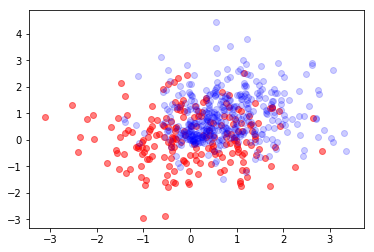

/home/monty/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:112: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
/home/monty/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:113: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.


a [0.         0.         0.         0.         0.         0.
 0.95521744 0.         0.        ]
b [ 0.75375955 -0.87474761 -0.93716307  0.29613403 -0.20208619  0.14570017
  0.          0.95521744  0.04889423  0.05515706  0.          0.95521744
 -0.00190904  0.02840166]
Step n= 0


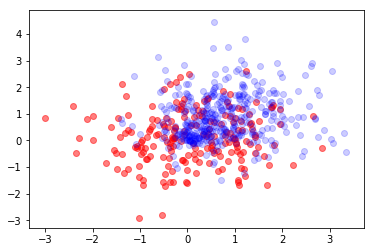

a [ 4.38985347e-02  4.73416802e-02 -1.45494514e-02  2.28699891e-02
 -4.65779061e-03 -4.49145525e-03  9.04948733e-01 -4.04892873e-05
  2.63274658e-06]
b [ 0.75479684 -0.88206324 -0.94573932  0.30672738 -0.19847247  0.15511606
 -0.00684422  0.85263897  0.04882668  0.05506884 -0.00710328  0.8526392
 -0.00192687  0.02833831]
Step n= 1


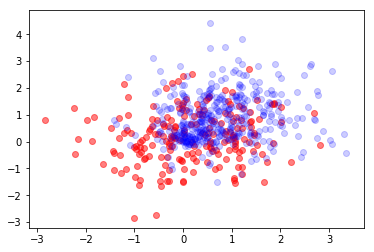

a [ 1.11434862e-01  1.20934138e-01 -3.74202070e-02  5.46444613e-02
 -1.26133115e-02 -1.16962142e-02  8.70752588e-01 -2.12816337e-04
 -7.81425192e-05]
b [ 0.75681406 -0.88831618 -0.95331853  0.32131379 -0.18716842  0.16950039
 -0.01507689  0.74505015  0.04871377  0.05491062 -0.01561754  0.74505266
 -0.00196106  0.02821945]
Step n= 2


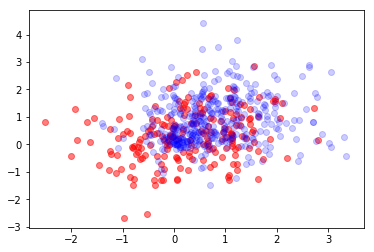

a [ 2.47354481e-01  2.71939551e-01 -8.62812664e-02  1.00596317e-01
 -3.30960770e-02 -2.79205301e-02  8.38263390e-01 -1.07655961e-03
 -5.32531053e-04]
b [ 0.76068294 -0.8824986  -0.94749352  0.34470288 -0.144875    0.19893926
 -0.02784797  0.65323958  0.04852527  0.05461609 -0.02874961  0.65325126
 -0.00198016  0.02801306]
Step n= 3


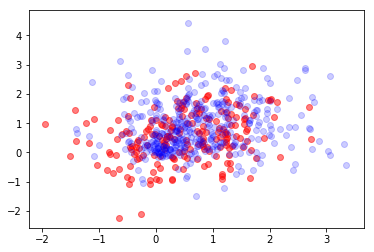

a [ 0.47735406  0.53497265 -0.18931589  0.10720013 -0.0961485  -0.06715748
  0.80705857 -0.00498879 -0.00249072]
b [ 0.76055158 -0.81879558 -0.87395554  0.3654602  -0.03257175  0.25178251
 -0.05200092  0.61557234  0.0485899   0.05447058 -0.05326913  0.61558522
 -0.0015358   0.0280838 ]
Step n= 4


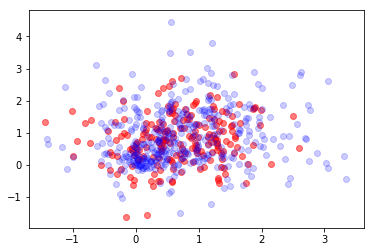

a [ 0.66387245  0.75266225 -0.31076981  0.04054614 -0.19568283 -0.11950407
  0.79063551 -0.01138324 -0.00660362]
b [ 7.41609066e-01 -7.13902630e-01 -7.52698874e-01  3.50000818e-01
  8.54645215e-02  2.84205510e-01 -8.84069263e-02  6.27978895e-01
  5.02655921e-02  5.58610807e-02 -8.91890451e-02  6.27927734e-01
  7.05997342e-04  2.98287580e-02]
Step n= 5


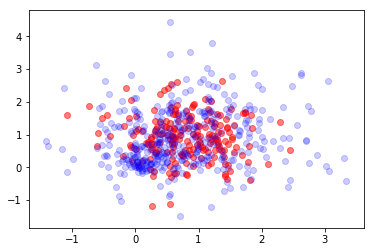

a [ 0.7760447   0.88669458 -0.40682699 -0.02906829 -0.28500771 -0.16317173
  0.78593784 -0.01656454 -0.01115328]
b [ 0.70615145 -0.60918039 -0.63804838  0.28836127  0.14222237  0.25367508
 -0.13012078  0.65422408  0.05517871  0.06027416 -0.12889579  0.65404404
  0.00631198  0.03469413]
Step n= 6


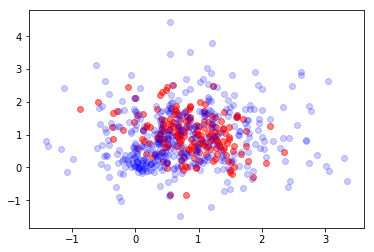

a [ 0.83668018  0.96158013 -0.47117059 -0.08375399 -0.35025563 -0.19360579
  0.78577464 -0.01964228 -0.0144156 ]
b [ 0.67306433 -0.49928558 -0.52084142  0.20357093  0.1595792   0.19024415
 -0.17642983  0.6852078   0.06485914  0.06913472 -0.1715654   0.68481835
  0.01672808  0.04403551]
Step n= 7


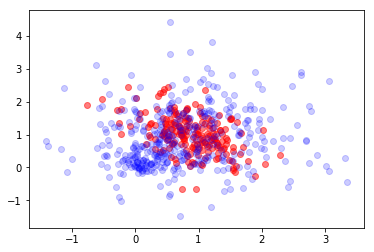

a [ 0.86187949  0.99330932 -0.50692582 -0.12432898 -0.38992553 -0.21147948
  0.78680386 -0.02077236 -0.01558514]
b [ 0.6511112  -0.38688264 -0.40249825  0.11245841  0.1540562   0.11619236
 -0.22838903  0.71831635  0.07979717  0.08275766 -0.21875021  0.71761047
  0.03235017  0.05809187]
Step n= 8


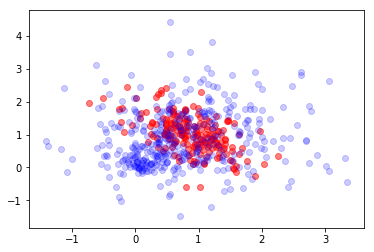

a [ 0.86461845  0.99703357 -0.52110616 -0.14201618 -0.40592759 -0.21882155
  0.78768531 -0.0206905  -0.01531063]
b [ 0.64247868 -0.33046384 -0.34373966  0.06453431  0.14542441  0.07597012
 -0.25868377  0.74343235  0.08899353  0.09103047 -0.24633422  0.74254255
  0.0418989   0.06659496]
Step n= 9


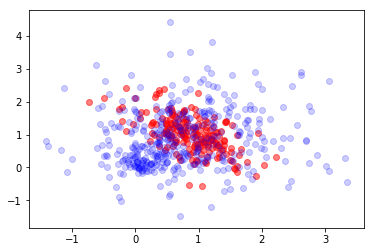

a [ 0.8612784   0.99304023 -0.5292255  -0.15480268 -0.41567214 -0.22341086
  0.78847169 -0.02021724 -0.01440915]
b [ 0.63797466 -0.27596279 -0.28761113  0.01736     0.13205534  0.03563786
 -0.28892826  0.77180713  0.09953165  0.10035656 -0.2737887   0.77066158
  0.05278907  0.07616193]
Step n= 10


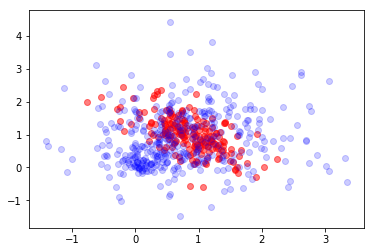

a [ 0.84874827  0.97583994 -0.52395314 -0.16515815 -0.41271387 -0.22283331
  0.78925172 -0.0187668  -0.01153143]
b [ 0.64239568 -0.17504935 -0.18680336 -0.06781403  0.09589924 -0.03810683
 -0.3476912   0.81452815  0.12428728  0.12144531 -0.32711304  0.8128227
  0.07825703  0.09777872]
Step n= 11


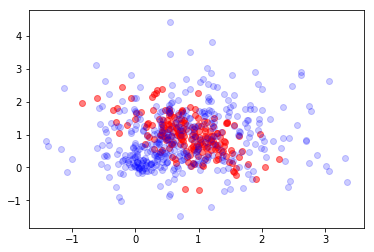

a [ 0.82757551  0.94922892 -0.50328504 -0.15326601 -0.39329608 -0.21542978
  0.78972744 -0.01638489 -0.0071581 ]
b [ 0.65394915 -0.08478121 -0.09997791 -0.14755404  0.0547481  -0.10784436
 -0.40606316  0.852958    0.15112822  0.14312241 -0.3805141   0.85079773
  0.10595829  0.12015792]
Step n= 12


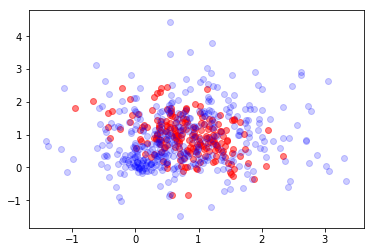

a [ 0.80008791  0.91862626 -0.46266881 -0.10853069 -0.35527333 -0.19903848
  0.7895681  -0.01281714 -0.00122552]
b [ 0.66915916 -0.01033289 -0.03055164 -0.22029904  0.02129043 -0.17177974
 -0.45904635  0.88707895  0.17676601  0.16274018 -0.42937819  0.88468933
  0.13256823  0.14060551]
Step n= 13


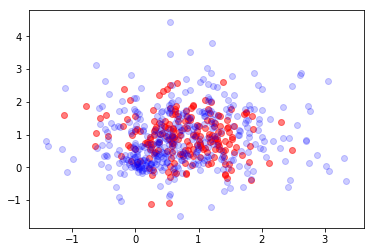

a [ 0.76888432  0.88846968 -0.39483821 -0.02905863 -0.29556996 -0.17007643
  0.78828821 -0.00769599  0.0064866 ]
b [ 0.68270355  0.04002742  0.01567707 -0.27884791  0.01282593 -0.22452413
 -0.49970238  0.9132796   0.1952681   0.17609608 -0.46717406  0.9110929
  0.1519889   0.15472161]
Step n= 14


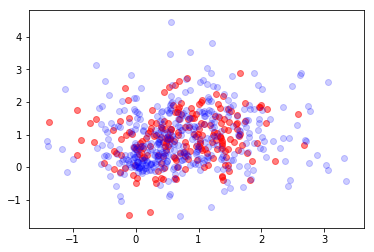

a [ 0.73817068  0.86222305 -0.30621748  0.05184105 -0.21970679 -0.13151401
  0.78694587 -0.00162169  0.01517396]
b [ 0.6900126   0.05793323  0.03252242 -0.30886525  0.03609804 -0.25469744
 -0.52272273  0.93035866  0.19956853  0.17823985 -0.48886752  0.92896471
  0.1572056   0.15747618]
Step n= 15


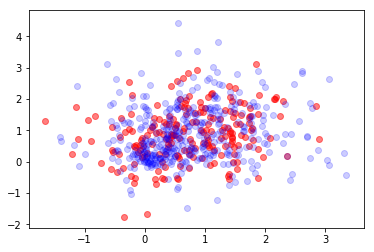

a [ 0.71036189  0.84049009 -0.21253496  0.08956415 -0.13644786 -0.09216966
  0.78740196  0.00363395  0.02291091]
b [ 0.69251979  0.04308182  0.02116246 -0.30069489  0.06776826 -0.25357707
 -0.53346167  0.94574256  0.18871626  0.16803161 -0.49957561  0.94542305
  0.14771319  0.14799629]
Step n= 16


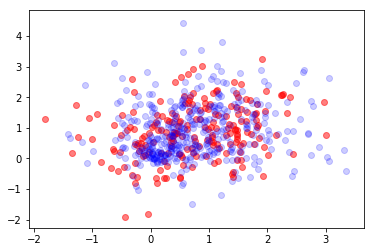

a [ 0.69383691  0.826667   -0.16636589  0.10326371 -0.0930678  -0.07364471
  0.78810875  0.00578698  0.0259039 ]
b [ 0.69304182  0.02572807  0.0068046  -0.28537473  0.08354663 -0.24414144
 -0.53832517  0.95822219  0.17931215  0.1594693  -0.50502641  0.95840213
  0.13918928  0.13989583]
Step n= 17


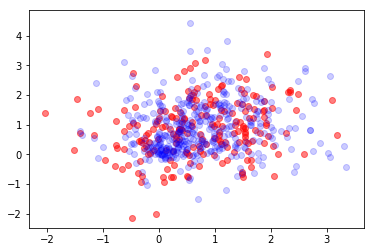

a [ 0.67813449  0.81202796 -0.10226082  0.08655358 -0.02621755 -0.05171374
  0.79104732  0.00877002  0.03068318]
b [ 0.69871249 -0.0235478  -0.03460876 -0.22560619  0.08334974 -0.19748507
 -0.5475055   0.98244315  0.15433419  0.13566967 -0.51561713  0.98329666
  0.11629424  0.11715558]
Step n= 18


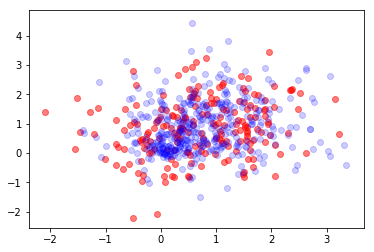

a [ 0.67192736  0.80397383 -0.08588349  0.08772273 -0.00426203 -0.04861623
  0.79274211  0.01015086  0.0325195 ]
b [ 0.70302927 -0.05154048 -0.05921311 -0.19198831  0.08038436 -0.16988768
 -0.55483747  0.99791437  0.14068633  0.1223752  -0.52407617  0.99902215
  0.10372829  0.10441723]
Step n= 19


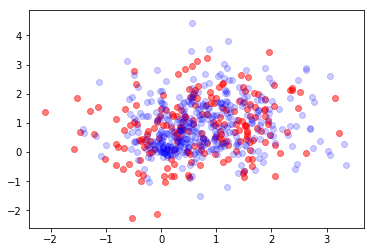

a [ 0.668697    0.79703912 -0.08459659  0.09130133  0.00582392 -0.05273903
  0.79477652  0.01163009  0.03432895]
b [ 0.70927578 -0.08031959 -0.08601194 -0.16101786  0.07860553 -0.14301675
 -0.56168559  1.01549694  0.12717129  0.10878185 -0.53212442  1.01676433
  0.09125503  0.09136882]
Step n= 20


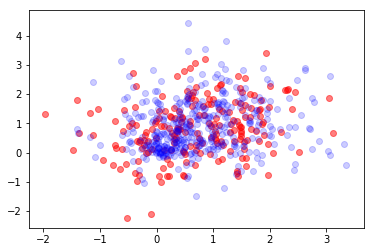

a [ 0.66781965  0.78546386 -0.12188928  0.10365501 -0.00956614 -0.08036594
  0.80039141  0.01603827  0.03867275]
b [ 0.7316537  -0.12888785 -0.13863904 -0.13197935  0.09043233 -0.11094759
 -0.57090093  1.04895826  0.10620289  0.08545539 -0.54375007  1.05015588
  0.07193319  0.0689647 ]
Step n= 21


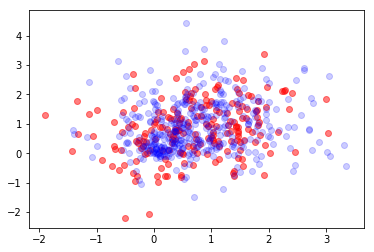

a [ 0.66636605  0.78181062 -0.1450462   0.1064422  -0.02368142 -0.0969913
  0.80391346  0.01898209  0.04195237]
b [ 0.74473959 -0.1507183  -0.16342847 -0.12556204  0.09808675 -0.10052052
 -0.57198064  1.06819775  0.09778541  0.07522372 -0.54575709  1.06932312
  0.06425434  0.05917684]
Step n= 22


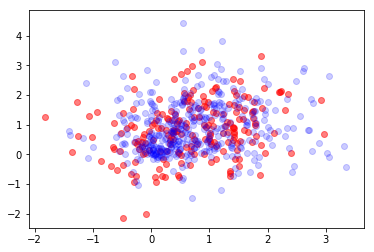

a [ 0.66533958  0.77979413 -0.16960626  0.10818137 -0.04113107 -0.11466776
  0.80785543  0.02254128  0.0459332 ]
b [ 0.75900863 -0.16900317 -0.18520731 -0.12686182  0.10761859 -0.09574624
 -0.57152616  1.08848159  0.09155909  0.06677384 -0.54606013  1.08949008
  0.05867402  0.05114267]
Step n= 23


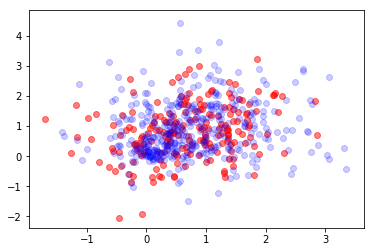

a [ 0.66293304  0.77935274 -0.20755123  0.11004512 -0.07439501 -0.14646116
  0.81654388  0.03181682  0.05569724]
b [ 0.78936116 -0.1934023  -0.21616641 -0.14800572  0.1316827  -0.10215911
 -0.57078642  1.12377897  0.08547315  0.05591305 -0.54656214  1.12450755
  0.05364649  0.04102745]
Step n= 24


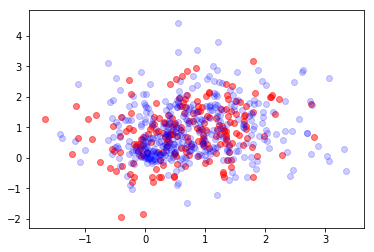

a [ 0.66328821  0.78486612 -0.222172    0.09834198 -0.09448753 -0.16915438
  0.8250635   0.04302204  0.0680862 ]
b [ 0.81702961 -0.20822443 -0.23475919 -0.17105651  0.14869272 -0.11279308
 -0.56998844  1.155427    0.08279841  0.04924432 -0.54636267  1.15592952
  0.05204807  0.0350967 ]
Step n= 25


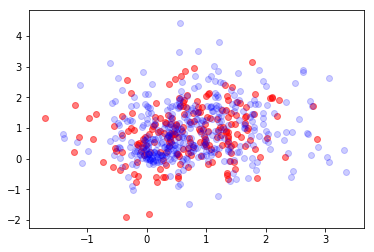

a [ 0.67041095  0.79617197 -0.21207892  0.07604485 -0.09802516 -0.18262184
  0.83339829  0.05551854  0.08247063]
b [ 0.83865474 -0.21500763 -0.24304358 -0.18282652  0.15260979 -0.11878275
 -0.57455786  1.18310286  0.0798957   0.0438179  -0.55112592  1.18352772
  0.05044342  0.03043551]
Step n= 26


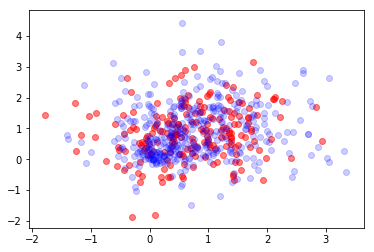

a [ 0.6836236   0.8107745  -0.19033514  0.05590813 -0.09225997 -0.19296932
  0.8424905   0.06932957  0.09858578]
b [ 0.85330913 -0.21616325 -0.24463514 -0.17922402  0.14616163 -0.11793753
 -0.58744335  1.20643733  0.07501794  0.03793191 -0.56410685  1.20694752
  0.04708423  0.02534137]
Step n= 27


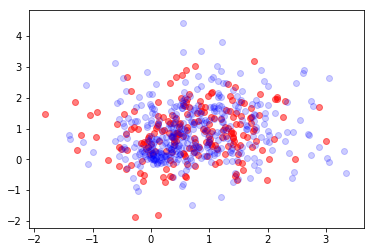

a [ 0.69679331  0.8236535  -0.17507113  0.04977486 -0.08759406 -0.20836985
  0.85357418  0.08526442  0.11687675]
b [ 0.86300772 -0.21595947 -0.24406139 -0.16925767  0.14040373 -0.11579569
 -0.60651381  1.22625563  0.06923888  0.03220204 -0.5833718   1.22690948
  0.04283929  0.02038447]
Step n= 28


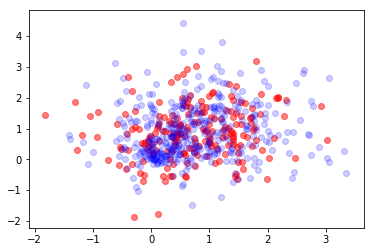

a [ 0.70440838  0.83103616 -0.17077414  0.05467215 -0.08615651 -0.23185549
  0.86763668  0.1046323   0.13856543]
b [ 0.87121252 -0.21779313 -0.24452634 -0.16385836  0.14196338 -0.11762881
 -0.62639624  1.2446065   0.06463748  0.0280272  -0.60352535  1.24533994
  0.03962041  0.01692432]
Step n= 29


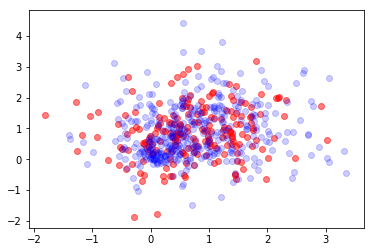

a [ 0.70573305  0.83237228 -0.17116623  0.0584706  -0.08619679 -0.24642414
  0.87575122  0.11566535  0.15122874]
b [ 0.8756167  -0.21946848 -0.24526764 -0.16335237  0.14435263 -0.11996765
 -0.63526886  1.25505715  0.06304454  0.02664731 -0.61250287  1.25579103
  0.03866356  0.0158833 ]
Step n= 30


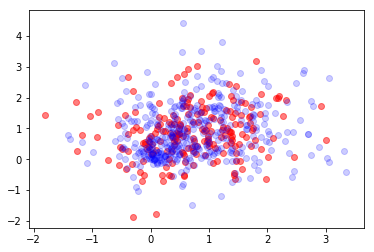

a [ 0.70532678  0.83238982 -0.17238359  0.06277117 -0.08587545 -0.26267915
  0.88487737  0.12793003  0.16521329]
b [ 0.88008571 -0.22209117 -0.24676219 -0.16518655  0.14822098 -0.1235277
 -0.64280453  1.26615186  0.06216241  0.02590446 -0.62011805  1.26685003
  0.0383592   0.01546134]
Step n= 31


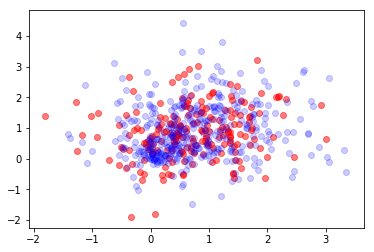

a [ 0.70264956  0.83088104 -0.17167955  0.0686877  -0.08107753 -0.29964918
  0.90785749  0.15749256  0.19730285]
b [ 0.88971844 -0.22961066 -0.25211099 -0.17363736  0.15869411 -0.13161502
 -0.65463437  1.28618774  0.06310812  0.02658741 -0.63209738  1.28672686
  0.04024973  0.01672045]
Step n= 32


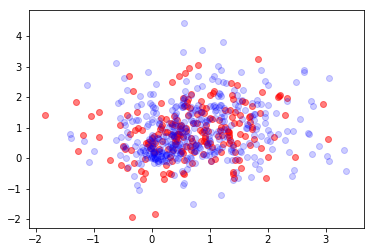

a [ 0.69880058  0.828535   -0.16255017  0.06862901 -0.0703172  -0.34265114
  0.93751372  0.19333214  0.23574134]
b [ 0.89997117 -0.23867625 -0.25932047 -0.18050424  0.16604433 -0.13668699
 -0.66193362  1.30463693  0.06667404  0.02945391 -0.63941206  1.30490103
  0.04456206  0.02008288]
Step n= 33


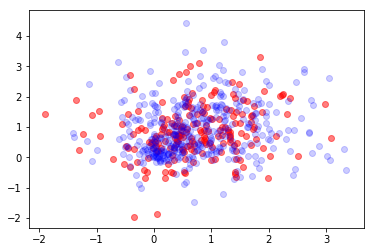

a [ 0.69561127  0.82661736 -0.14569699  0.0662261  -0.05497858 -0.39535298
  0.97644252  0.2365708   0.28120845]
b [ 0.90932657 -0.24962455 -0.26901331 -0.18183623  0.16961727 -0.13701498
 -0.66551347  1.32044989  0.0728262   0.03470291 -0.6429068   1.32031327
  0.05123291  0.02571831]
Step n= 34


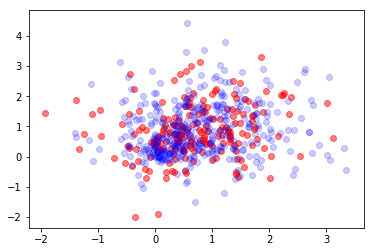

a [ 0.69321115  0.82493977 -0.13519319  0.06423653 -0.04610856 -0.42644497
  0.99907767  0.26033314  0.30710108]
b [ 0.91387188 -0.25584983 -0.27480966 -0.18046626  0.1700502  -0.13563595
 -0.66472777  1.32809801  0.0767805   0.03815298 -0.64199327  1.32766397
  0.05535804  0.02931376]
Step n= 35


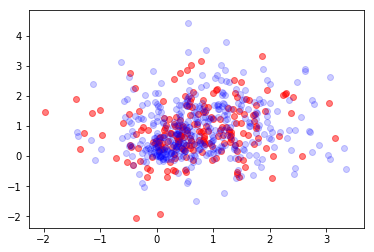

a [ 0.69137508  0.82389213 -0.12345874  0.06260367 -0.03667613 -0.46051241
  1.02412415  0.28550199  0.33418523]
b [ 0.91741255 -0.26284137 -0.28156498 -0.17704791  0.16975112 -0.13280895
 -0.66261723  1.33455441  0.08135648  0.04220769 -0.63973001  1.3337793
  0.06001269  0.03346204]
Step n= 36


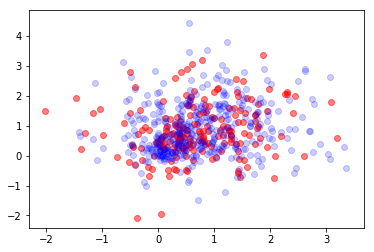

a [ 0.68999609  0.82348758 -0.11075042  0.06132797 -0.02679966 -0.49827233
  1.05181141  0.31231416  0.36260282]
b [ 0.91989763 -0.27075549 -0.28937336 -0.17133512  0.16922011 -0.12835889
 -0.65889676  1.33951275  0.08665059  0.04697307 -0.63582973  1.33834133
  0.06527608  0.03825855]
Step n= 37


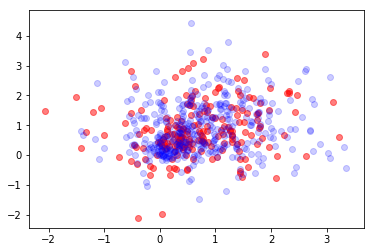

a [ 0.68903164  0.82380201 -0.09743987  0.06010264 -0.01665213 -0.53958536
  1.08164247  0.34037837  0.39186583]
b [ 0.92119028 -0.27968582 -0.29825336 -0.16319517  0.16864661 -0.12216315
 -0.65322852  1.3425005   0.09264211  0.05243645 -0.62995261  1.34087327
  0.07110625  0.04367515]
Step n= 38


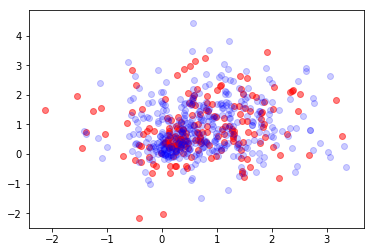

a [ 6.88688889e-01  8.26747223e-01 -7.59930451e-02  6.37920801e-02
 -1.12607084e-04 -6.35958330e-01  1.14760348e+00  4.01217798e-01
  4.49368930e-01]
b [ 0.91967574 -0.30236344 -0.32045419 -0.14178225  0.17290966 -0.10600403
 -0.63766297  1.34094235  0.10856528  0.06738973 -0.61403536  1.33824725
  0.08604883  0.05815784]
Step n= 39


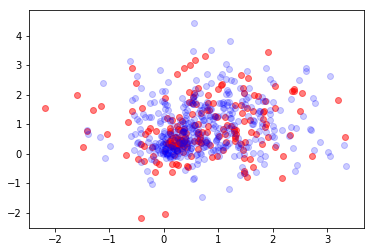

a [ 0.68927877  0.82995062 -0.0613048   0.0557657   0.01162029 -0.68204301
  1.17686947  0.42871533  0.47695668]
b [ 0.91722875 -0.31453708 -0.33227682 -0.12647483  0.17196942 -0.09398409
 -0.62356588  1.3349143   0.11591818  0.07428101 -0.59962075  1.33162062
  0.09273692  0.06467138]
Step n= 40


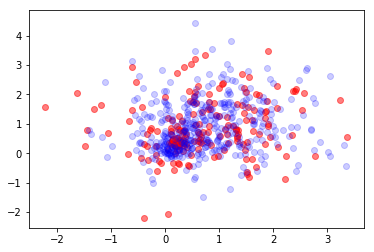

a [ 0.6922833   0.83560131 -0.04760582  0.04687976  0.02287035 -0.72593606
  1.2030307   0.45346395  0.50154234]
b [ 0.91286412 -0.32657216 -0.34375717 -0.10777463  0.16823673 -0.07885711
 -0.60836917  1.32610868  0.12278495  0.08065133 -0.58410568  1.32228379
  0.09884312  0.07057626]
Step n= 41


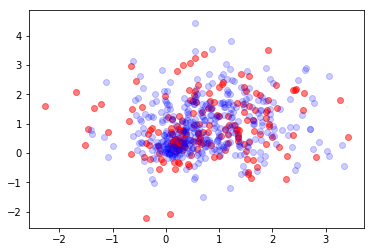

a [ 0.69766407  0.84348815 -0.03640056  0.03870242  0.03246168 -0.76772311
  1.22566517  0.47555708  0.52325619]
b [ 0.90624319 -0.33826634 -0.35480142 -0.08611388  0.16279553 -0.06095511
 -0.59249044  1.31504667  0.12925795  0.08653503 -0.56791624  1.31078265
  0.10447822  0.07592106]
Step n= 42


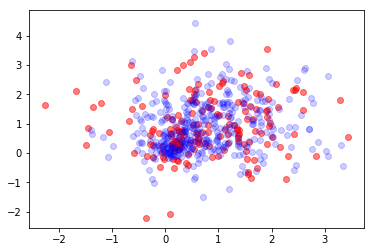

a [ 0.70943956  0.85887633 -0.03258158  0.03721928  0.03811364 -0.84377312
  1.25575951  0.51041565  0.55467729]
b [ 0.88714536 -0.36031491 -0.37573651 -0.04536544  0.15824256 -0.02593737
 -0.56147448  1.29195759  0.14295911  0.09840709 -0.53632646  1.28701955
  0.11622967  0.08649537]
Step n= 43


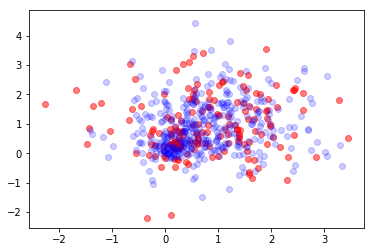

a [ 0.71767178  0.86962802 -0.0319531   0.02910345  0.03976769 -0.87546762
  1.26570786  0.52521316  0.56853592]
b [ 0.87456055 -0.37065797 -0.38542358 -0.02485801  0.15426222 -0.00783334
 -0.54467107  1.27970496  0.14926829  0.10383174 -0.51919186  1.27458677
  0.12158536  0.09125695]
Step n= 44


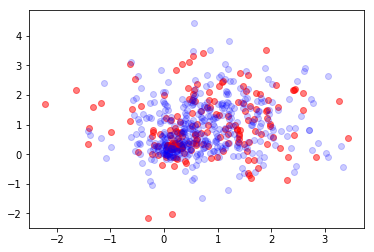

a [ 0.73038661  0.88509154 -0.04421425  0.02777048  0.0321028  -0.92898109
  1.27331584  0.54826642  0.58815783]
b [ 0.84648964 -0.38660479 -0.40043277  0.00572456  0.152421    0.0208501
 -0.51489178  1.26195331  0.16368795  0.11620642 -0.48863734  1.25653075
  0.13407404  0.10224718]
Step n= 45


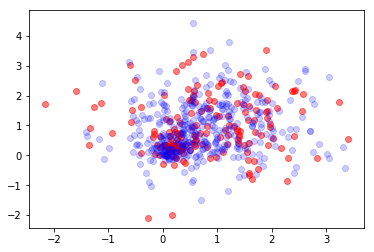

a [ 0.74247922  0.89906865 -0.0596498   0.02294211  0.02047552 -0.96924392
  1.27251693  0.56770148  0.60354874]
b [ 0.81537462 -0.39704801 -0.41038987  0.02692616  0.15198066  0.04188012
 -0.48759314  1.25200024  0.17916967  0.12998238 -0.46026102  1.24628874
  0.1477144   0.11464113]
Step n= 46


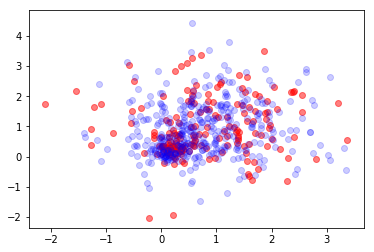

a [ 0.75431212  0.91152201 -0.07468755  0.01621418  0.00778573 -0.99949483
  1.26781579  0.58543827  0.61670155]
b [ 0.78277893 -0.4010822  -0.41445187  0.0410368   0.15112118  0.05638466
 -0.46444101  1.24991064  0.19545632  0.14513209 -0.43564544  1.24380943
  0.16227742  0.12843748]
Step n= 47


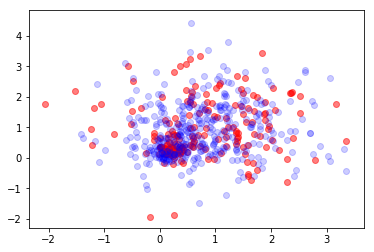

a [ 0.76556308  0.92240666 -0.08770577  0.00917939 -0.00422263 -1.02267674
  1.26188142  0.60262508  0.62891297]
b [ 0.74977199 -0.39930316 -0.41311104  0.05024263  0.14931216  0.06573338
 -0.44602328  1.25407896  0.21203947  0.16126017 -0.41536472  1.24745028
  0.17724926  0.14324466]
Step n= 48


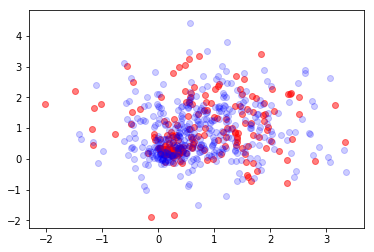

a [ 0.77565881  0.93153523 -0.09830689  0.00291513 -0.01462705 -1.04107885
  1.25603809  0.61986161  0.64097027]
b [ 0.71719387 -0.39313843 -0.40756912  0.05618293  0.14662022  0.07125003
 -0.43204079  1.26251046  0.22842337  0.17790137 -0.39915903  1.25522385
  0.19210846  0.15858472]
Step n= 49
done


In [9]:
#local minimax algorithm, rejction using G, update eta with D
Niter = 50
eps = 1e-6
eta0 = 0.05
eta = eta0
etaC = 2.0

#setting up initial b, and minvar,D
vx = np.cov(x.T)
vy = np.cov(y.T)
mx = np.mean(x,axis=0)
my = np.mean(y,axis=0)
# vxy = np.var(np.concatenate([x.T,y.T]))
D = np.sqrt(np.max([vx[0,0],vx[1,1],vy[0,0],vy[1,1]]))
# mxy = np.mean(np.concatenate([x,y]))
#initial a
a0 = np.zeros(da)
a0[6] = 1/D
#initial b
b0 = np.zeros(db)
B0 = 0.5*(la.inv(vy)-la.inv(vx))
b0[3] = B0[0,0]
b0[4] = B0[0,1]+B0[1,0]
b0[5] = B0[1,1]
B1 = la.solve(vx,mx) - la.solve(vy,my)
b0[1] = B1[0]
b0[2] = B1[1]
b0[0] = 0.5*(my.dot(la.solve(vy,my)) - mx.dot(la.solve(vx,mx)))
b0[7] = 1/D
b0[11]=1/D
b0[8:10] = 0.1*np.random.uniform(low=-1.0,high=1.0,size=2)
b0[12:] = 0.1*np.random.uniform(low=-1.0,high=1.0,size=2)
z = np.concatenate([a0,b0],axis=0)
I = np.eye(da+db)
minvar0 = 1e-12
dsq = spatial.distance.cdist(x,y,'sqeuclidean')
minvar = np.amax(np.amin(dsq,axis=1),axis=0) + minvar0
delta0 = np.sqrt(minvar)
dsq2 = spatial.distance.cdist(x,x,'sqeuclidean')
dsq2 += 1000*np.eye(Nx)
minvar2 = np.mean(np.amin(dsq2,axis=1),axis=0) + minvar0
deltainf =  np.sqrt(minvar2)
deltainf = delta0/5 #debug

delta = delta0
#Initial gradient
Gn,Hn = GH(a0,b0,delta,D)
Hxx = Hn[:da,:da]; Hyy = Hn[da:,da:]; Gx = Gn[:da]; Gy = Gn[da:]
Mn = Gx.T.dot(la.lstsq(Hxx,Gx)[0])
mn = Gy.T.dot(la.lstsq(Hyy,Gy)[0])

x0 = x[:,0]
x1 = x[:,1]
x0a7 = x0+z[7]
x1a8 = x1+z[8]
argexpT = z[6]**2*(x0a7**2+x1a8**2)
expT = np.exp(-0.5*argexpT)
T = np.zeros((Nx,2))
T[:,0] = z[0] + (1+z[2])*x0+z[3]*x1+z[5]*z[6]**2 * x0a7*expT
T[:,1] = z[1] + z[3]*x0+(1+z[4])*x1+z[5]*z[6]**2 * x1a8*expT

Dn = abs(Mn + mn)
###debug####
listG = []
listD = []
listS = []
lists = []
listeta = []
############

for n in range(Niter):
    Gnold = Gn
    Dnold = Dn
    
    delta = (delta0-deltainf)*np.exp(-5*(n+1)/Niter) + deltainf
    ####Debug########
    listG.append(la.norm(Gn,2))
    listD.append(Dn)
    listS.append(Mn)
    lists.append(mn)
    listeta.append(eta)
    #PLOTS FOR DEBUG
    x0a7 = x0+z[7]
    x1a8 = x1+z[8]
    argexpT = z[6]**2*(x0a7**2+x1a8**2)
    expT = np.exp(-0.5*argexpT)
    T = np.zeros((Nx,2))
    T[:,0] = z[0] + (1+z[2])*x0+z[3]*x1+z[5]*z[6]**2 * x0a7*expT
    T[:,1] = z[1] + z[3]*x0+(1+z[4])*x1+z[5]*z[6]**2 * x1a8*expT
    plt.scatter(T[:,0],T[:,1], color='red', alpha = 0.5);
    plt.scatter(y[:,0],y[:,1], color='blue', alpha = 0.2);
    plt.draw()
    plt.pause(1e-5)
    print('a',z[:da])
    print('b',z[da:])
    print('Step n=',n)
    ##########################################     
    
    if la.norm(Gn,2)<eps:
        break
    #reject moves if bad direction
    baddir = True
    eta = 2.0*eta
    while(baddir and eta>eta0):
        eta = eta/2.0
        dz = la.solve((1.0/eta)*I+Hn,Gn)
        baddir = dz.dot(Gn)<0.0
    z = z - dz
    
    Gn,Hn = GH(z[:da],z[da:],delta,D)
    Hxx = Hn[:da,:da]; Hyy = Hn[da:,da:]; Gx = Gn[:da]; Gy = Gn[da:]
    Mn = Gx.T.dot(la.lstsq(Hxx,Gx)[0])
    mn = Gy.T.dot(la.lstsq(Hyy,Gy)[0])
    Dn = abs(Mn + mn)
    #etamin = eta0/(la.norm(Gn,2)+1)#debug
    if Dn<=Dnold:
        eta = min((etaC+0.1)*eta,1.0/(1+la.norm(Gn,2)))#debug
    else:
        eta = max(eta/etaC, 0.5/(1+la.norm(Gn,2)))
print('done')

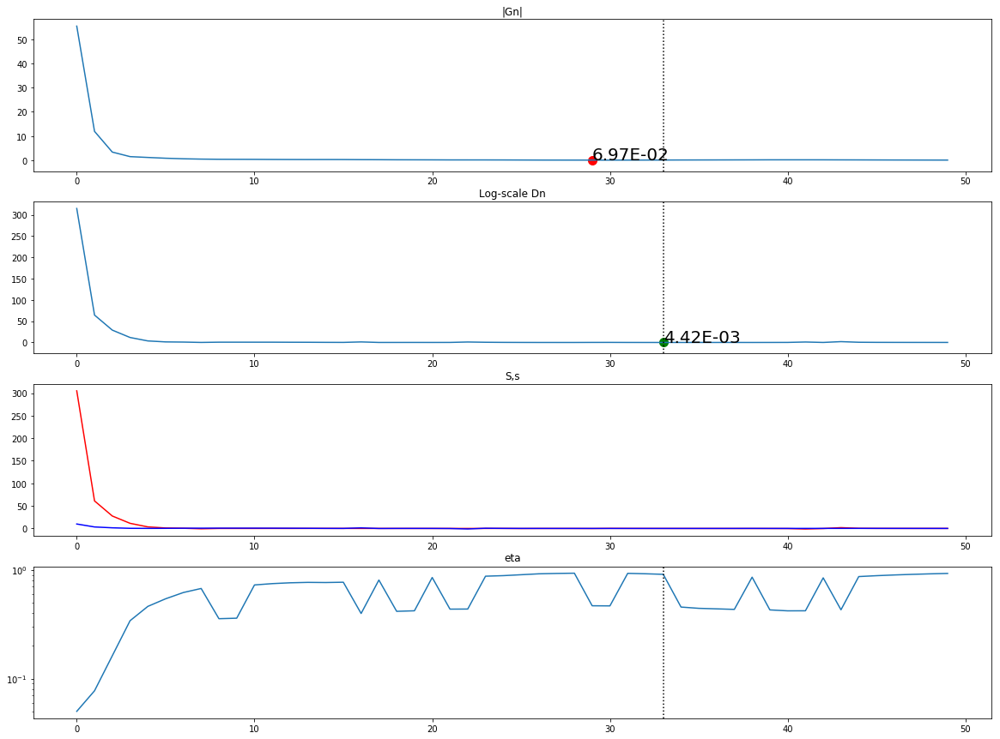

In [10]:
from decimal import Decimal
#####DEBUG#####
#find minimal Gn, Dn
minG = np.min(listG)
iminG = np.argmin(listG)
minD = np.min(np.absolute(listD))
iminD = np.argmin(np.absolute(listD))

fig = plt.figure(figsize=(20,15))

ax1 = fig.add_subplot(4, 1, 1)
ax1.plot(listG)
ax1.scatter(iminG,minG, c = 'r', s = 100)
decG = '%.2E' % Decimal(minG)
ax1.annotate(decG, (iminG,minG+0.1), fontsize=20)
ax1.set_title('|Gn|')
ax1.axvline(iminD, c = 'black', ls = 'dotted')

ax2 = fig.add_subplot(4, 1, 2)
ax2.plot(listD)
ax2.scatter(iminD,minD, c = 'g', s = 100)
decD = '%.2E' % Decimal(minD)
ax2.annotate(decD, (iminD,minD+0.1), fontsize=20)
ax2.axvline(iminD, c = 'black', ls = 'dotted')
ax2.set_title('Log-scale Dn')

ax3 = fig.add_subplot(4, 1, 3)
ax3.plot(listS, c = 'r')
ax3.plot(lists, c = 'b')
ax3.set_title('S,s');

ax4 = fig.add_subplot(4, 1, 4)
ax4.semilogy(listeta)
ax4.axvline(iminD, c = 'black', ls = 'dotted')
ax4.set_title('eta');
###############

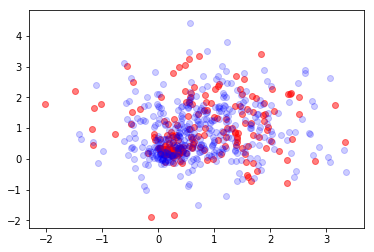

In [13]:
plt.scatter(T[:,0],T[:,1], color='red', alpha = 0.5);
plt.scatter(y[:,0],y[:,1], color='blue', alpha = 0.2);

## Packaged Algorithm

In [16]:
def local_ot(x,y,Niter=100):#Updates eta using Dn instead of Gn
    d = 2
    Nx = len(x)
    Ny = len(y)
    da = 9
    db = 14

    #Precomputed data, (twisted) gradient and Hessian
    # xh = np.concatenate([x.reshape(Nx,d),np.ones((Nx,d))],axis=1)

    gammaA = 2*1e-1 #alpha regularization parameter 
    gammaB = 2*1e-1 #beta regularization parameter

    def GH(a,b,eps,D):
        x0 = x[:,0]
        x1 = x[:,1]
        x0a7 = x0+a[7]
        x1a8 = x1+a[8]
        argexpT = a[6]**2*(x0a7**2+x1a8**2)
        expT = np.exp(-0.5*argexpT)
        T = np.zeros((Nx,2))
        T[:,0] = a[0] + (1+a[2])*x0+a[3]*x1+a[5]*a[6]**2 * x0a7*expT
        T[:,1] = a[1] + a[3]*x0+(1+a[4])*x1+a[5]*a[6]**2 * x1a8*expT
        T0 = T[:,0]
        T1 = T[:,1]
        y0 = y[:,0]
        y1 = y[:,1]
        g0y = b[0]+ b[1]*y0+b[2]*y1+0.5*b[3]*y0**2+b[4]*y0*y1+0.5*b[5]*y1**2
        y0b8 = y0+b[8]
        y1b9 = y1+b[9]
        y0b12 = y0+b[12]
        y1b13 = y1+b[13]
        argexpy1 =  b[7]**2*(y0b8**2+y1b9**2)
        expy1 = np.exp(-0.5*argexpy1)
        argexpy2 =  b[11]**2*(y0b12**2+y1b13**2)
        expy2 = np.exp(-0.5*argexpy2)
        g1y = b[6]*expy1
        g2y = b[10]*expy2
        gy = g0y + g1y + g2y
        g0T =b[0]+ b[1]*T0+b[2]*T1+0.5*b[3]*T0**2+b[4]*T0*T1+0.5*b[5]*T1**2
        T0b8 = T0+b[8]
        T1b9 = T1+b[9]
        T0b12 = T0+b[12]
        T1b13 = T1+b[13]
        argexpT1 =  b[7]**2*(T0b8**2+T1b9**2)
        expT1 = np.exp(-0.5*argexpT1)
        argexpT2 =  b[11]**2*(T0b12**2+T1b13**2)
        expT2 = np.exp(-0.5*argexpT2)
        g1T = b[6]*expT1
        g2T = b[10]*expT2
        gT = g0T + g1T + g2T   

        #first derivatives
        gzT = np.zeros((Nx,2))
        gzT[:,0] = b[1]+b[3]*T0+b[4]*T1
        gzT[:,0] += -b[6]*b[7]**2*T0b8*expT1
        gzT[:,0] += -b[10]*b[11]**2*T0b12*expT2
        gzT[:,1] = b[2]+b[4]*T0+b[5]*T1
        gzT[:,1] += -b[6]*b[7]**2*T1b9*expT1
        gzT[:,1] += -b[10]*b[11]**2*T1b13*expT2

        daT = np.zeros((Nx,da,d))
        daT[:,0,:] = np.array([1,0])
        daT[:,1,:] = np.array([0,1])
        daT[:,2,0] = x0
        daT[:,3,0] = x1
        daT[:,3,1] = x0
        daT[:,4,1] = x1
        daT[:,5,0] = expT*a[6]**2*x0a7
        daT[:,5,1] = expT*a[6]**2*x1a8
        daT[:,6,0] = a[5]*a[6]*expT*x0a7*(2-argexpT)
        daT[:,6,1] = a[5]*a[6]*expT*x1a8*(2-argexpT)
        daT[:,7,0] = a[5]*a[6]*expT*(1-a[6]**2*x0a7**2)
        daT[:,7,1] = -a[5]*a[6]*expT*a[6]**2*x0a7*x1a8
        daT[:,8,0] = daT[:,7,1]
        daT[:,8,1] = a[5]*a[6]*expT*(1-a[6]**2*x1a8**2)

        #gradient w.r.t. a
        penalty_a = np.zeros(da)
        penalty_a[6] = a[6]*eps**2*np.exp(eps**2*a[6]**2) - 1.0/(D**2 * a[6]**3)
        penalty_a[7] = a[7] * 1.0/(10*D**2)
        penalty_a[8] = a[8] * 1.0/(10*D**2)
        daL = (1.0/Nx) * np.einsum('ijk,ik->j',daT,gzT) + gammaA*(0.00+(1/(2*Nx))*la.norm(gzT))*penalty_a

        expgy = np.exp(gy)
        dbgy = np.zeros((Ny,db))
        dbgT = np.zeros((Nx,db))
        dbgy[:,0] = np.ones(Ny)
        dbgT[:,0] = np.ones(Nx)
        dbgy[:,1] = y0
        dbgT[:,1] = T0
        dbgy[:,2] = y1
        dbgT[:,2] = T1
        dbgy[:,3] = 0.5*y0**2
        dbgT[:,3] = 0.5*T0**2
        dbgy[:,4] = y0*y1
        dbgT[:,4] = T0*T1
        dbgy[:,5] = 0.5*y1**2
        dbgT[:,5] = 0.5*T1**2
        dbgy[:,6] = expy1
        dbgT[:,6] = expT1
        dbgy[:,7] = -b[6]*b[7]*argexpy1*expy1
        dbgT[:,7] = -b[6]*b[7]*argexpT1*expT1
        dbgy[:,8] = -b[6]*b[7]**2*y0b8*expy1
        dbgT[:,8] = -b[6]*b[7]**2*T0b8*expT1
        dbgy[:,9] = -b[6]*b[7]**2*y1b9*expy1
        dbgT[:,9] = -b[6]*b[7]**2*T1b9*expT1
        dbgy[:,10] = expy2
        dbgT[:,10] = expT2
        dbgy[:,11] = -b[10]*b[11]*argexpy2*expy2
        dbgT[:,11] = -b[10]*b[11]*argexpT2*expT2
        dbgy[:,12] = -b[10]*b[11]**2*y0b12*expy2
        dbgT[:,12] = -b[10]*b[11]**2*T0b12*expT2
        dbgy[:,13] = -b[10]*b[11]**2*y1b13*expy2
        dbgT[:,13] = -b[10]*b[11]**2*T1b13*expT2
        #gradient w.r.t. b
        penalty_b = np.zeros(db)
        penalty_b[7] = b[7]*eps**2 * np.exp(eps**2 * b[7]**2) - 1.0/(D**2 * b[7]**3)
        penalty_b[11] = b[11]*eps**2 * np.exp(eps**2 * b[11]**2) - 1.0/(D**2 * b[11]**3)
        penalty_b[8] = b[8] * 1.0/(10*D**2)
        penalty_b[9] = b[9] * 1.0/(10*D**2)
        penalty_b[12] = b[12] * 1.0/(10*D**2)
        penalty_b[13] = b[13] * 1.0/(10*D**2)
        dbL = (1.0/Nx)*np.sum(dbgT,axis=0) - (1.0/Ny)*np.einsum('ik,i->k',dbgy,expgy) - gammaB*penalty_b

        #twisted gradient
        G = np.concatenate([daL,-dbL],axis=0)

        #Second derivatives
        gzzT = np.zeros((Nx,d,d))
        gzzT[:,0,0] = b[3] - b[6]*b[7]**2*(1-b[7]**2*T0b8**2)*expT1-b[10]*b[11]**2*(1-b[11]**2*T0b12**2)*expT2
        gzzT[:,1,0] = b[4] - b[6]*b[7]**2*(1-b[7]**2*T0b8*T1b9)*expT1-b[10]*b[11]**2*(1-b[11]**2*T0b12*T1b13)*expT2
        gzzT[:,0,1] = gzzT[:,1,0]
        gzzT[:,1,1] = b[5] - b[6]*b[7]**2*(1-b[7]**2*T1b9**2)*expT1-b[10]*b[11]**2*(1-b[11]**2*T1b13**2)*expT2

        daaT = np.zeros((Nx,da,da,d))
        daaT[:,5,6,0] = a[6]*x0a7*expT*(2-argexpT)
        daaT[:,6,5,0] = daaT[:,5,6,0]
        daaT[:,5,6,1] = a[6]*x1a8*expT*(2-argexpT)
        daaT[:,6,5,1] = daaT[:,5,6,1]
        daaT[:,5,7,0] = a[6]**2*expT*(1-a[6]**2*x0a7**2)
        daaT[:,7,5,0] = daaT[:,5,7,0]
        daaT[:,5,7,1] = -a[6]**4*expT*x0a7*x1a8
        daaT[:,7,5,1] = daaT[:,5,7,1]
        daaT[:,5,8,0] = daaT[:,5,7,1]
        daaT[:,8,5,0] = daaT[:,5,7,1]
        daaT[:,5,8,1] = a[6]**2*expT*(1-a[6]**2*x1a8**2)
        daaT[:,5,8,1] = daaT[:,8,5,1]
        daaT[:,6,6,0] = a[5]*x0a7*expT*(2-3*argexpT-(2-argexpT)*argexpT)
        daaT[:,6,6,1] = a[5]*x1a8*expT*(2-3*argexpT-(2-argexpT)*argexpT)
        daaT[:,6,7,0] = a[5]*a[6]*expT*(2-a[6]**2*(3*x0a7**2+x1a8**2)-x0a7**2*a[6]**2*(2-argexpT))
        daaT[:,6,7,1] = -a[5]*expT*(x1a8)*a[6]**3*x0a7*(4-argexpT)
        daaT[:,7,6,0] = daaT[:,6,7,0]
        daaT[:,7,6,1] = daaT[:,6,7,1]
        daaT[:,6,8,0] = daaT[:,6,7,1]
        daaT[:,8,6,0] = daaT[:,6,7,1]
        daaT[:,6,8,1] = a[5]*a[6]*expT*(2-a[6]**2*(3*x1a8**2+x0a7**2)-x1a8**2*a[6]**2*(2-argexpT))
        daaT[:,8,6,1] = daaT[:,6,8,1]
        daaT[:,7,7,0] = -a[5]*a[6]**4*expT*x0a7*(3-x0a7**2*a[6]**2)
        daaT[:,7,7,1] = -a[5]*a[6]**4*x1a8*expT*(1-a[6]**2*x0a7**2)
        daaT[:,7,8,0] = daaT[:,7,7,1]
        daaT[:,8,7,0] = daaT[:,7,7,1]
        daaT[:,7,8,1] = -a[5]*a[6]**4*expT*x0a7*(1-a[6]**2*x1a8**2)
        daaT[:,8,7,1] = daaT[:,7,8,1]
        daaT[:,8,8,0] = -a[5]*a[6]**4*x0a7*expT*(1-a[6]**2*x1a8**2)
        daaT[:,8,8,1] = -a[5]*a[6]**4*expT*x1a8*(3-x1a8**2*a[6]**2)
        #Hessian w.r.t. aa
        penaltyH_a = np.zeros((da,da))
        penaltyH_a[6,6] = eps**2 * np.exp((a[6]*eps)**2)*(1.0+2.0*a[6]**2*eps**2) + 3/(D**2 * a[6]**4)
        penaltyH_a[7,7] = 1*1.0/(10*D**2)
        penaltyH_a[8,8] = 1*1.0/(10*D**2)
        daaL = (1.0/Nx)*(np.einsum('ijkl,il->jk',daaT,gzT) + np.einsum('ijl,ilm,ikm->jk',daT,gzzT,daT)) + gammaA*(0.00+(1/(2*Nx))*la.norm(gzT))*penaltyH_a

        dbzgT = np.zeros((Nx,db,d))
        dbzgT[:,1,0]=np.ones(Nx)
        dbzgT[:,2,1]=np.ones(Nx)
        dbzgT[:,3,0]=T0
        dbzgT[:,4,0]=T1
        dbzgT[:,4,1]=T0
        dbzgT[:,5,1]=T1
        dbzgT[:,6,0]=-b[6]**2*T0b8*expT1
        dbzgT[:,6,1]=-b[6]**2*T1b9*expT1
        dbzgT[:,7,0]=-b[6]*b[7]*expT1*T0b8*(2-argexpT1)
        dbzgT[:,7,1]=-b[6]*b[7]*expT1*T1b9*(2-argexpT1)
        dbzgT[:,8,0]=-b[6]*b[7]**2*expT1*(1-b[7]**2*T0b8**2)
        dbzgT[:,8,1]=b[6]*b[7]**4*expT1*T0b8*T1b9
        dbzgT[:,9,0]=dbzgT[:,8,1]
        dbzgT[:,9,1]=-b[6]*b[7]**2*expT1*(1-b[7]**2*T1b9**2)
        dbzgT[:,10,0]=-b[10]**2*T0b12*expT2
        dbzgT[:,10,1]=-b[10]**2*T1b13*expT2
        dbzgT[:,11,0]=-b[10]*b[11]*expT2*T0b12*(2-argexpT2)
        dbzgT[:,11,1]=-b[10]*b[11]*expT2*T1b13*(2-argexpT2)
        dbzgT[:,12,0]=-b[10]*b[11]**2*expT2*(1-b[11]**2*T0b12**2)
        dbzgT[:,12,1]=b[10]*b[11]**4*expT2*T0b12*T1b13
        dbzgT[:,13,0]=dbzgT[:,12,1]
        dbzgT[:,13,1]=-b[10]*b[11]**2*expT2*(1-b[11]**2*T1b13**2)
        # #Hessian w.r.t. ab
        dabL = (1.0/Nx)*np.einsum('ikl,ijl->jk',dbzgT,daT)

        dbbgy = np.zeros((Ny,db,db))
        dbbgT = np.zeros((Nx,db,db))
        dbbgy[:,6,7] = -b[7]*(y0b8**2+y1b9**2)*expy1
        dbbgy[:,7,6] = dbbgy[:,6,7]
        dbbgy[:,6,8] = -b[7]**2*y0b8*expy1
        dbbgy[:,8,6] = dbbgy[:,6,8]
        dbbgy[:,6,9] = -b[7]**2*y1b9*expy1
        dbbgy[:,9,6] = dbbgy[:,6,9]
        dbbgy[:,7,7] = -b[6]*(y0b8**2+y1b9**2)*expy1*(1-argexpy1)
        dbbgy[:,7,8] = -b[6]*b[7]*expy1*y0b8*(2-argexpy1)
        dbbgy[:,8,7] = dbbgy[:,7,8]
        dbbgy[:,7,9] = -b[6]*b[7]*expy1*y1b9*(2-argexpy1)
        dbbgy[:,9,7] = dbbgy[:,7,9]
        dbbgy[:,8,8] = -b[6]*b[7]**2*expy1*(1-y0b8**2*b[7]**2)
        dbbgy[:,8,9] = b[6]*b[7]**4*y0b8*y1b9*expy1
        dbbgy[:,9,8] = dbbgy[:,8,9] 
        dbbgy[:,9,9] = -b[6]*b[7]**2*expy1*(1-y1b9**2*b[7]**2)
        dbbgy[:,10,11] = -b[11]*(y0b12**2+y1b13**2)*expy2
        dbbgy[:,11,10] = dbbgy[:,10,11]
        dbbgy[:,10,12] = -b[11]**2*y0b12*expy2
        dbbgy[:,12,10] = dbbgy[:,10,12]
        dbbgy[:,10,13] = -b[11]**2*y1b13*expy2
        dbbgy[:,13,10] = dbbgy[:,10,13]
        dbbgy[:,11,11] = -b[10]*(y0b12**2+y1b13**2)*expy2*(1-argexpy2)
        dbbgy[:,11,12] = -b[10]*b[11]*expy2*y0b12*(2-argexpy2)
        dbbgy[:,12,11] = dbbgy[:,11,12]
        dbbgy[:,11,13] = -b[10]*b[11]*expy2*y1b13*(2-argexpy2)
        dbbgy[:,13,11] = dbbgy[:,11,13]
        dbbgy[:,12,12] = -b[10]*b[11]**2*expy2*(1-y0b12**2*b[11]**2)
        dbbgy[:,12,13] = b[10]*b[11]**4*y0b12*y1b13*expy2
        dbbgy[:,13,12] = dbbgy[:,12,13] 
        dbbgy[:,13,13] = -b[10]*b[11]**2*expy2*(1-y1b13**2*b[11]**2)
        dbbgT[:,6,7] = -b[7]*(T0b8**2+T1b9**2)*expT1
        dbbgT[:,7,6] = dbbgT[:,6,7]
        dbbgT[:,6,8] = -b[7]**2*T0b8*expT1
        dbbgT[:,8,6] = dbbgT[:,6,8]
        dbbgT[:,6,9] = -b[7]**2*T1b9*expT1
        dbbgT[:,9,6] = dbbgT[:,6,9]
        dbbgT[:,7,7] = -b[6]*(T0b8**2+T1b9**2)*expT1*(1-argexpT1)
        dbbgT[:,7,8] = -b[6]*b[7]*expT1*T0b8*(2-argexpT1)
        dbbgT[:,8,7] = dbbgT[:,7,8]
        dbbgT[:,7,9] = -b[6]*b[7]*expT1*T1b9*(2-argexpT1)
        dbbgT[:,9,7] = dbbgT[:,7,9]
        dbbgT[:,8,8] = -b[6]*b[7]**2*expT1*(1-T0b8**2*b[7]**2)
        dbbgT[:,8,9] = b[6]*b[7]**4*T0b8*T1b9*expT1
        dbbgT[:,9,8] = dbbgT[:,8,9] 
        dbbgT[:,9,9] = -b[6]*b[7]**2*expT1*(1-T1b9**2*b[7]**2)
        dbbgT[:,10,11] = -b[11]*(T0b12**2+T1b13**2)*expT2
        dbbgT[:,11,10] = dbbgT[:,10,11]
        dbbgT[:,10,12] = -b[11]**2*T0b12*expT2
        dbbgT[:,12,10] = dbbgT[:,10,12]
        dbbgT[:,10,13] = -b[11]**2*T1b13*expT2
        dbbgT[:,13,10] = dbbgT[:,10,13]
        dbbgT[:,11,11] = -b[10]*(T0b12**2+T1b13**2)*expT2*(1-argexpT2)
        dbbgT[:,11,12] = -b[10]*b[11]*expT2*T0b12*(2-argexpT2)
        dbbgT[:,12,11] = dbbgT[:,11,12]
        dbbgT[:,11,13] = -b[10]*b[11]*expT2*T1b13*(2-argexpT2)
        dbbgT[:,13,11] = dbbgT[:,11,13]
        dbbgT[:,12,12] = -b[10]*b[11]**2*expT2*(1-T0b12**2*b[11]**2)
        dbbgT[:,12,13] = b[10]*b[11]**4*T0b12*T1b13*expT2
        dbbgT[:,13,12] = dbbgT[:,12,13] 
        dbbgT[:,13,13] = -b[10]*b[11]**2*expT2*(1-T1b13**2*b[11]**2)

        dbgdbg = np.einsum('jn,jm->jnm',dbgy,dbgy)
        #Hessian w.r.t. bb
        penaltyH_b = np.zeros((db,db))
        # penaltyH_b[5,5] = 1*1.0/(10*D**2)+1*6*eps**2 *(b[5]-b[8])**(-4)
        # penaltyH_b[8,8] = 1*1.0/(10*D**2)+1*6*eps**2 *(b[5]-b[8])**(-4)
        # penaltyH_b[5,8] = -1*6*eps**2 *(b[5]-b[8])**(-4)
        # penaltyH_b[8,5] = -1*6*eps**2 *(b[5]-b[8])**(-4)
        penaltyH_b[7,7] = eps**2 * np.exp((b[7]*eps)**2)*(1.0+2.0*b[7]**2*eps**2) + 3/(D**2 * b[7]**4)
        penaltyH_b[8,8] = 1*1.0/(10*D**2)
        penaltyH_b[9,9] = 1*1.0/(10*D**2)
        penaltyH_b[11,11] = eps**2 * np.exp((b[11]*eps)**2)*(1.0+2.0*b[11]**2*eps**2) + 3/(D**2 * b[11]**4)
        penaltyH_b[12,12] = 1*1.0/(10*D**2)
        penaltyH_b[13,13] = 1*1.0/(10*D**2)
        dbbL = (1.0/Nx)*np.sum(dbbgT,axis=0) - (1.0/Ny)*np.einsum('jnm,j->nm',(dbbgy+dbgdbg),expgy) - gammaB*penaltyH_b

        # #Twisted Hessian
        H = np.zeros((da+db,da+db))
        H[:da,:da] = daaL
        H[:da,da:] = dabL
        H[da:,:da] = -dabL.T
        H[da:,da:] = -dbbL
        return(G,H)     
    #local minimax algorithm, rejction using G, update eta with D
#     Niter = 50
    eps = 1e-6
    eta0 = 0.05
    eta = eta0
    etaC = 2.0

    #setting up initial b, and minvar,D
    vx = np.cov(x.T)
    vy = np.cov(y.T)
    mx = np.mean(x,axis=0)
    my = np.mean(y,axis=0)
    # vxy = np.var(np.concatenate([x.T,y.T]))
    D = np.sqrt(np.max([vx[0,0],vx[1,1],vy[0,0],vy[1,1]]))
    # mxy = np.mean(np.concatenate([x,y]))
    #initial a
    a0 = np.zeros(da)
    a0[6] = 1/D
    #initial b
    b0 = np.zeros(db)
    B0 = 0.5*(la.inv(vy)-la.inv(vx))
    b0[3] = B0[0,0]
    b0[4] = B0[0,1]+B0[1,0]
    b0[5] = B0[1,1]
    B1 = la.solve(vx,mx) - la.solve(vy,my)
    b0[1] = B1[0]
    b0[2] = B1[1]
    b0[0] = 0.5*(my.dot(la.solve(vy,my)) - mx.dot(la.solve(vx,mx)))
    b0[7] = 1/D
    b0[11]=1/D
    b0[8:10] = 0.1*np.random.uniform(low=-1.0,high=1.0,size=2)
    b0[12:] = 0.1*np.random.uniform(low=-1.0,high=1.0,size=2)
    z = np.concatenate([a0,b0],axis=0)
    I = np.eye(da+db)
    minvar0 = 1e-12
    dsq = spatial.distance.cdist(x,y,'sqeuclidean')
    minvar = np.amax(np.amin(dsq,axis=1),axis=0) + minvar0
    delta0 = np.sqrt(minvar)
    dsq2 = spatial.distance.cdist(x,x,'sqeuclidean')
    dsq2 += 1000*np.eye(Nx)
    minvar2 = np.mean(np.amin(dsq2,axis=1),axis=0) + minvar0
    deltainf =  np.sqrt(minvar2)
    deltainf = delta0/5 #debug

    delta = delta0
    #Initial gradient
    Gn,Hn = GH(a0,b0,delta,D)
    Hxx = Hn[:da,:da]; Hyy = Hn[da:,da:]; Gx = Gn[:da]; Gy = Gn[da:]
    Mn = Gx.T.dot(la.lstsq(Hxx,Gx)[0])
    mn = Gy.T.dot(la.lstsq(Hyy,Gy)[0])

    x0 = x[:,0]
    x1 = x[:,1]
    x0a7 = x0+z[7]
    x1a8 = x1+z[8]
    argexpT = z[6]**2*(x0a7**2+x1a8**2)
    expT = np.exp(-0.5*argexpT)
    T = np.zeros((Nx,2))
    T[:,0] = z[0] + (1+z[2])*x0+z[3]*x1+z[5]*z[6]**2 * x0a7*expT
    T[:,1] = z[1] + z[3]*x0+(1+z[4])*x1+z[5]*z[6]**2 * x1a8*expT

    Dn = abs(Mn + mn)

    for n in range(Niter):
        Gnold = Gn
        Dnold = Dn

        delta = (delta0-deltainf)*np.exp(-5*(n+1)/Niter) + deltainf
#         ####Debug########
#         listG.append(la.norm(Gn,2))
#         listD.append(Dn)
#         listS.append(Mn)
#         lists.append(mn)
#         listeta.append(eta)
#         #PLOTS FOR DEBUG
#         x0a7 = x0+z[7]
#         x1a8 = x1+z[8]
#         argexpT = z[6]**2*(x0a7**2+x1a8**2)
#         expT = np.exp(-0.5*argexpT)
#         T = np.zeros((Nx,2))
#         T[:,0] = z[0] + (1+z[2])*x0+z[3]*x1+z[5]*z[6]**2 * x0a7*expT
#         T[:,1] = z[1] + z[3]*x0+(1+z[4])*x1+z[5]*z[6]**2 * x1a8*expT
#         plt.scatter(T[:,0],T[:,1], color='red', alpha = 0.5);
#         plt.scatter(y[:,0],y[:,1], color='blue', alpha = 0.2);
#         plt.draw()
#         plt.pause(1e-5)
#         print('a',z[:da])
#         print('b',z[da:])
#         print('Step n=',n)
        ##########################################     

        if la.norm(Gn,2)<eps:
            break
        #reject moves if bad direction
        baddir = True
        eta = 2.0*eta
        while(baddir and eta>eta0):
            eta = eta/2.0
            dz = la.solve((1.0/eta)*I+Hn,Gn)
            baddir = dz.dot(Gn)<0.0
        z = z - dz

        Gn,Hn = GH(z[:da],z[da:],delta,D)
        Hxx = Hn[:da,:da]; Hyy = Hn[da:,da:]; Gx = Gn[:da]; Gy = Gn[da:]
        Mn = Gx.T.dot(la.lstsq(Hxx,Gx)[0])
        mn = Gy.T.dot(la.lstsq(Hyy,Gy)[0])
        Dn = abs(Mn + mn)
        #etamin = eta0/(la.norm(Gn,2)+1)#debug
        if Dn<=Dnold:
            eta = min((etaC+0.1)*eta,1.0/(1+la.norm(Gn,2)))#debug
        else:
            eta = max(eta/etaC, 0.5/(1+la.norm(Gn,2)))
    a,b = z[:da],z[da:]
    x0a7 = x0+z[7]
    x1a8 = x1+z[8]
    argexpT = z[6]**2*(x0a7**2+x1a8**2)
    expT = np.exp(-0.5*argexpT)
    T = np.zeros((Nx,2))
    T[:,0] = z[0] + (1+z[2])*x0+z[3]*x1+z[5]*z[6]**2 * x0a7*expT
    T[:,1] = z[1] + z[3]*x0+(1+z[4])*x1+z[5]*z[6]**2 * x1a8*expT
    return(T,a,b)

/home/monty/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:333: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
/home/monty/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:334: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
/home/monty/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:389: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we adv

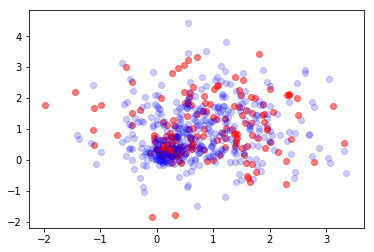

In [20]:
Txa,a,b = local_ot(x,y,Niter=50)
#plots
plt.scatter(Txa[:,0],Txa[:,1], color='red', alpha = 0.5);
plt.scatter(y[:,0],y[:,1], color='blue', alpha = 0.2);

# Global Algorithm

## Open Version

In [47]:
def idx_choice(x,y):
    Nx = len(x)
    Ny = len(y)
    #assignement for x:
    idxx = np.zeros(Nx)
    q = int(Nx/Ny)
    r = Nx % Ny
    for i in range(q):
        idxx[i*Ny:(i+1)*Ny] = np.random.choice(np.arange(Ny),Ny,replace=False)
    if r!=0: 
        idxx[-r:] = np.random.choice(np.arange(Ny),r,replace=False)
    #assignement for y:
    idxy = np.zeros(Ny)
    q = int(Ny/Nx)
    r = Ny % Nx
    for i in range(q):
        idxy[i*Nx:(i+1)*Nx] = np.random.choice(np.arange(Nx),Nx,replace=False)
    if r!=0: 
        idxy[-r:] = np.random.choice(np.arange(Nx),r,replace=False)
    return(y[idxx.astype(int)],x[idxy.astype(int)])   

0.0


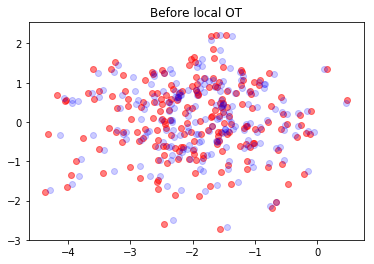

/home/monty/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:333: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
/home/monty/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:334: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
/home/monty/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:389: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we adv

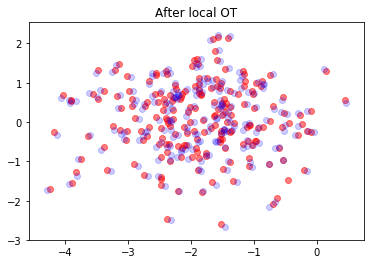

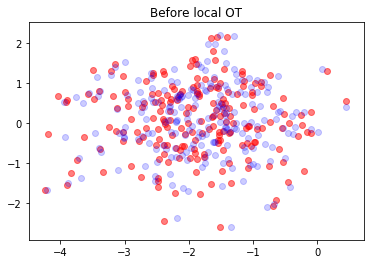

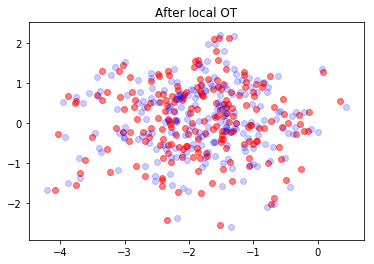

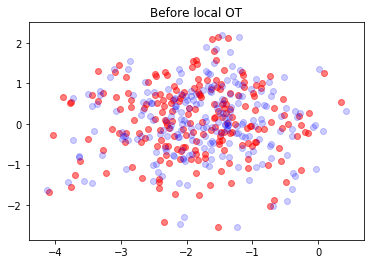

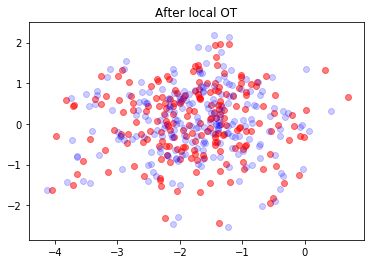

...

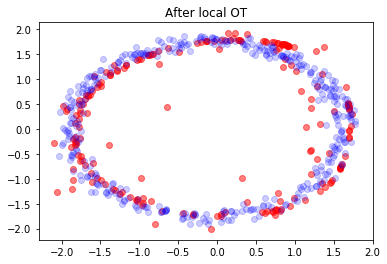

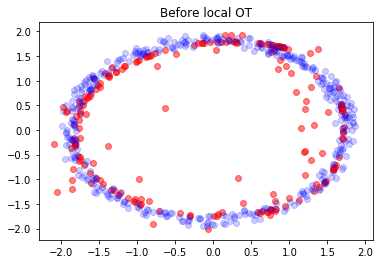

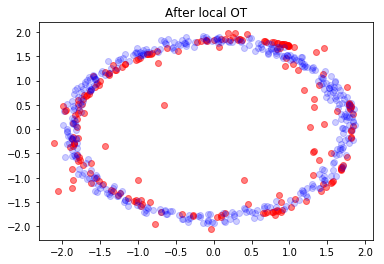

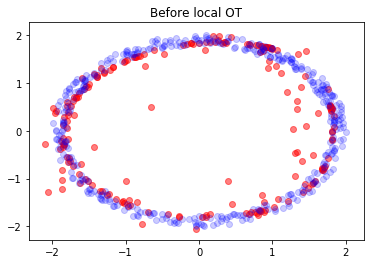

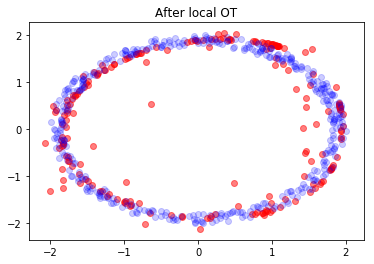

1.0


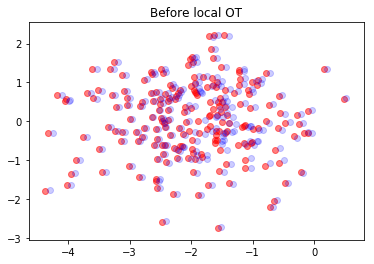

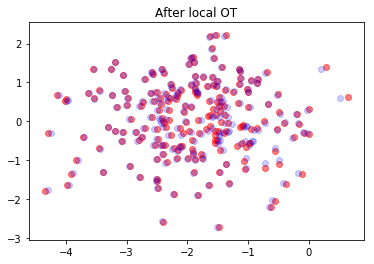

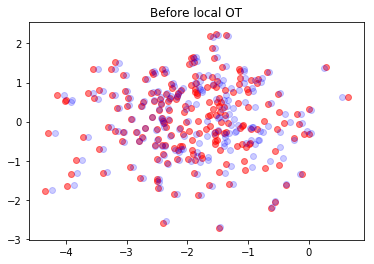

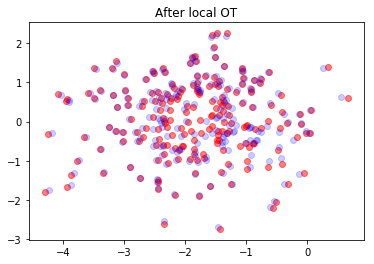

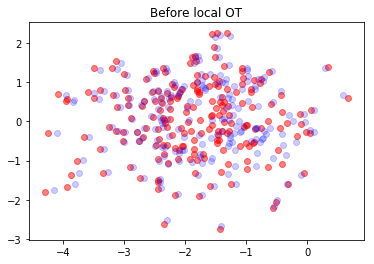

...

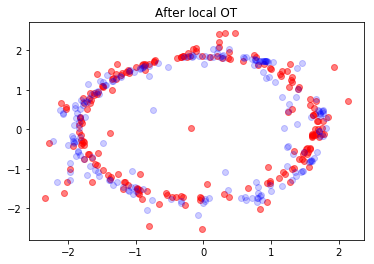

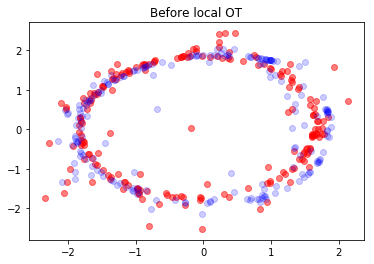

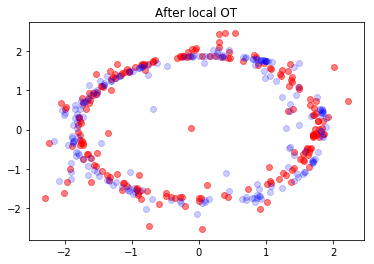

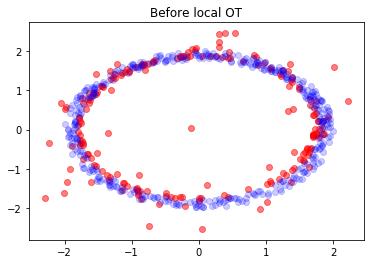

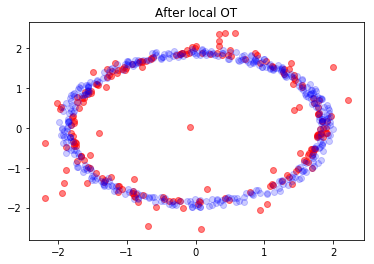

2.0


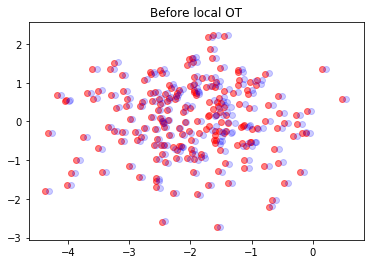

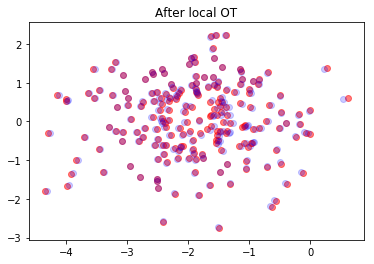

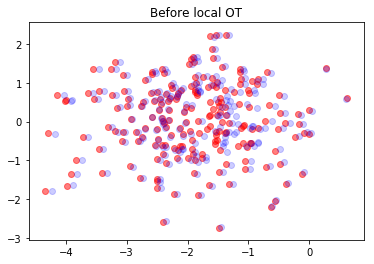

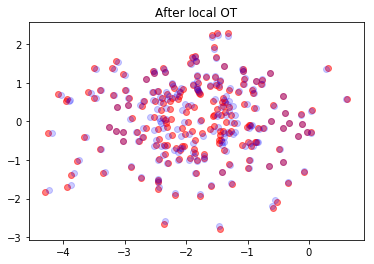

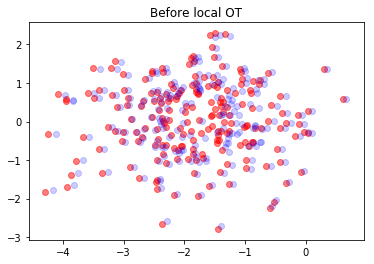

...

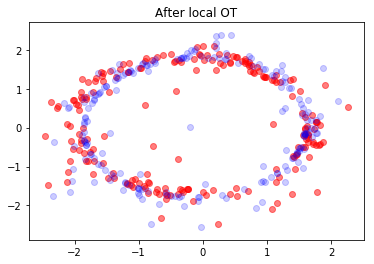

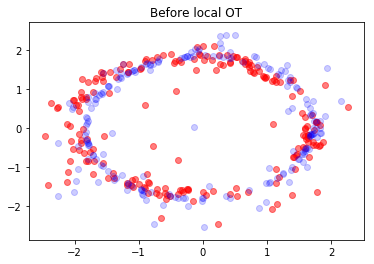

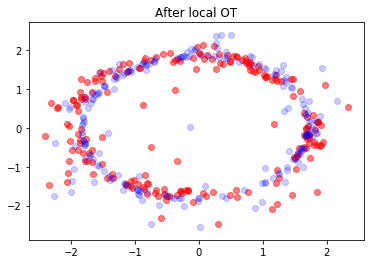

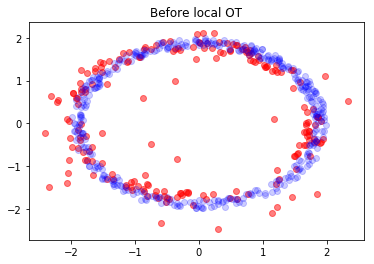

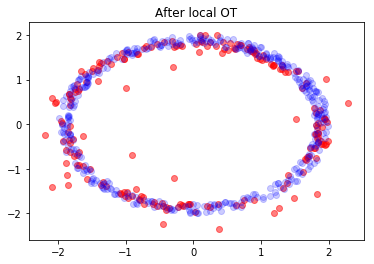

3.0


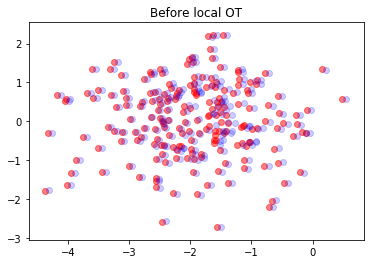

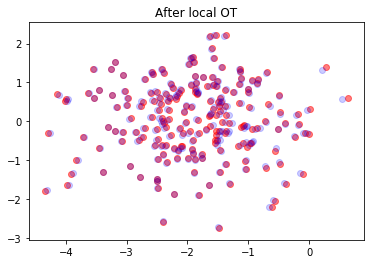

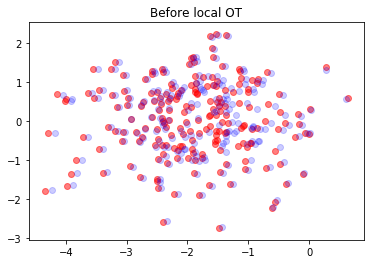

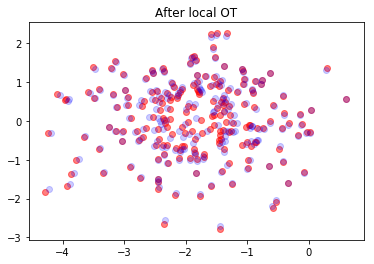

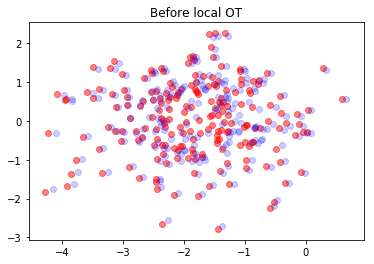

...

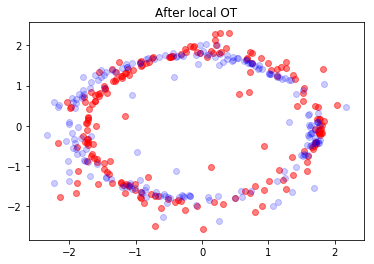

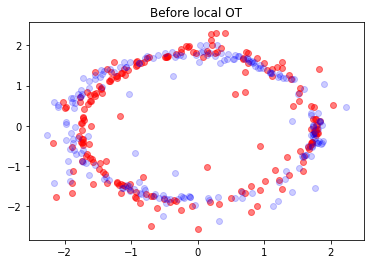

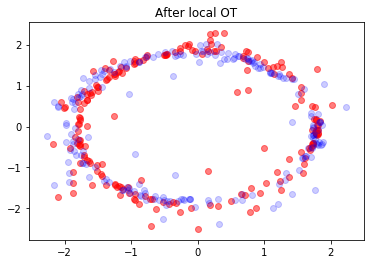

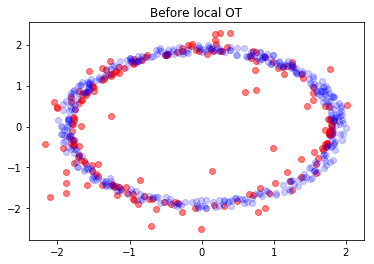

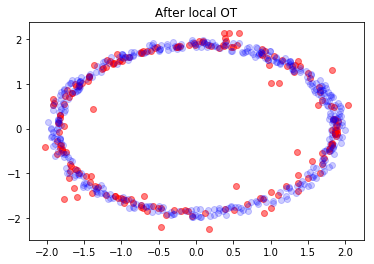

4.0


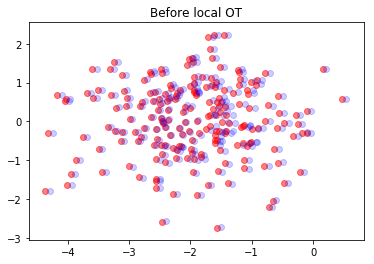

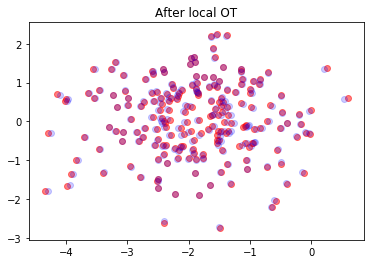

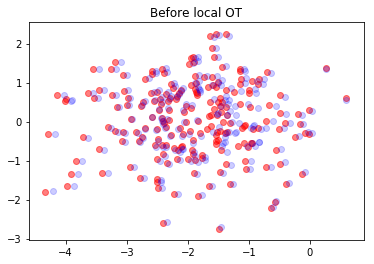

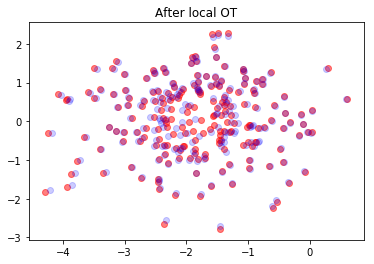

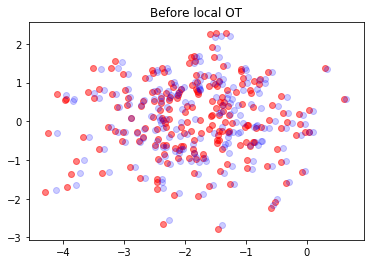

...

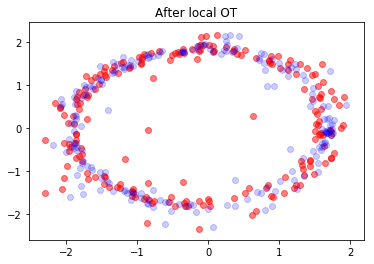

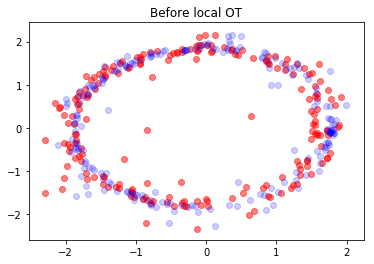

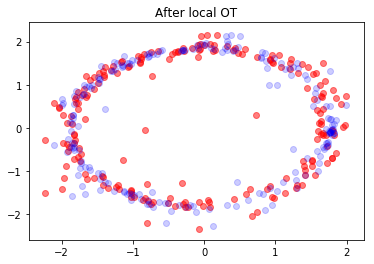

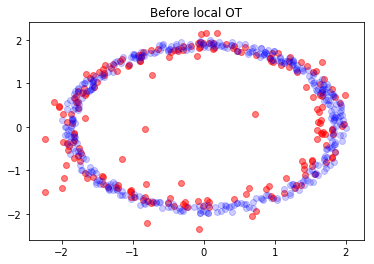

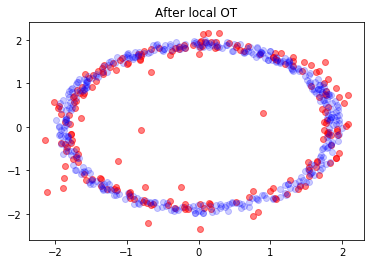

5.0


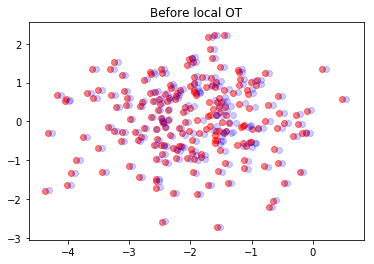

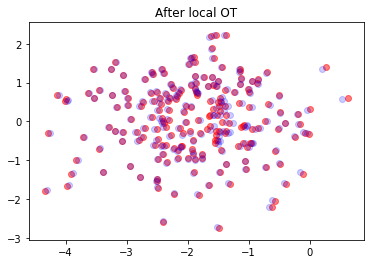

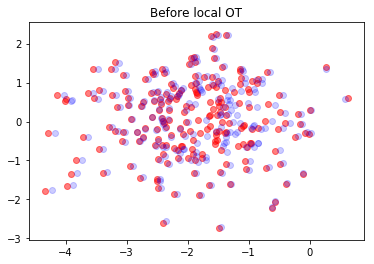

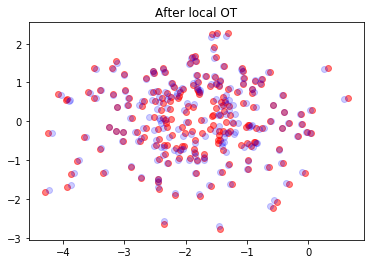

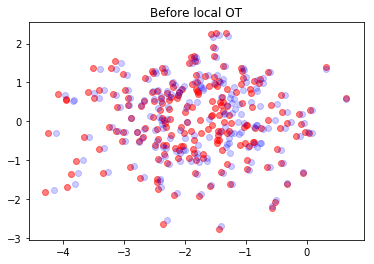

...

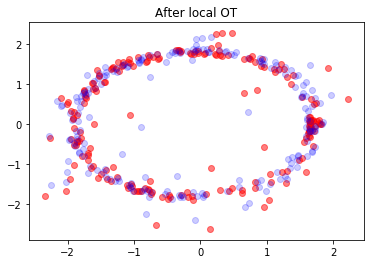

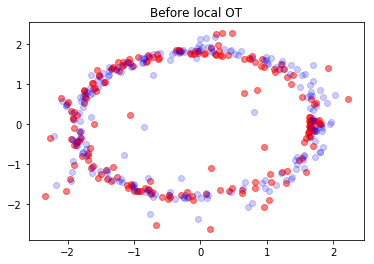

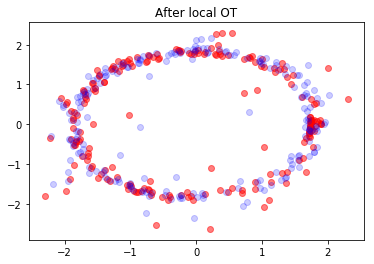

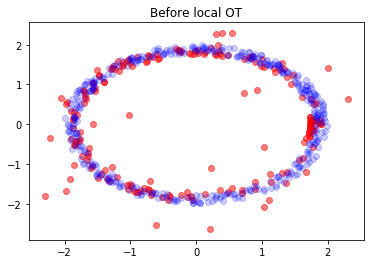

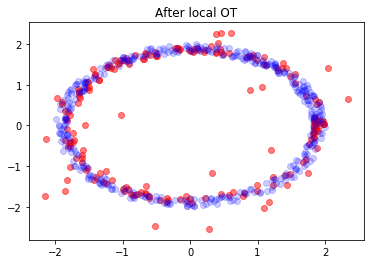

6.0


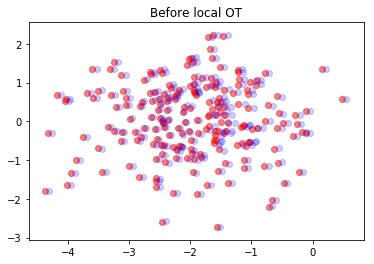

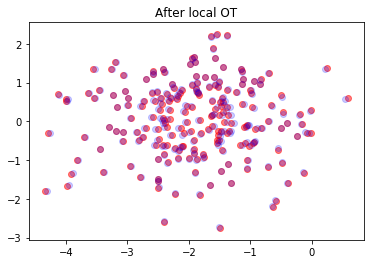

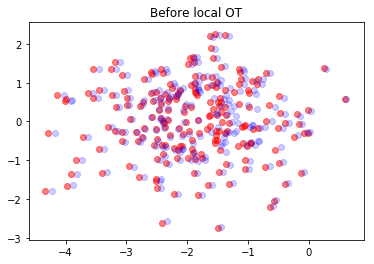

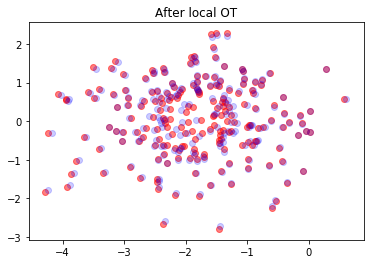

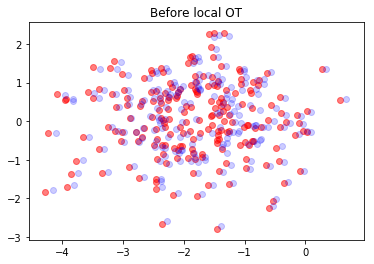

...

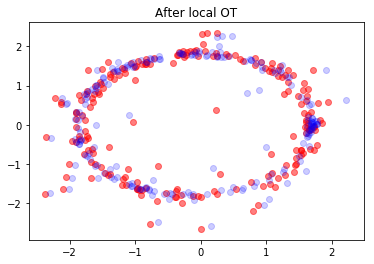

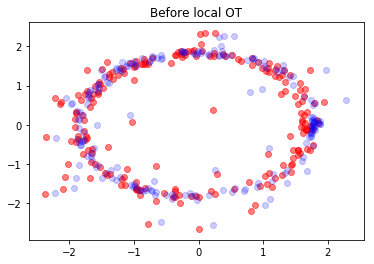

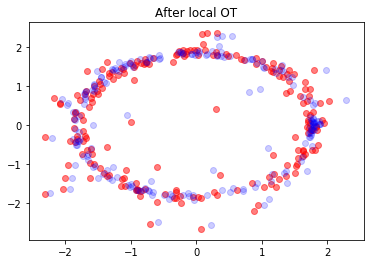

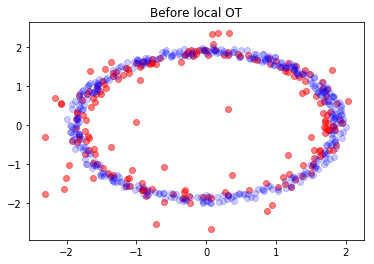

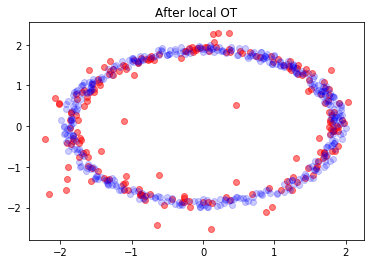

7.000000000000001


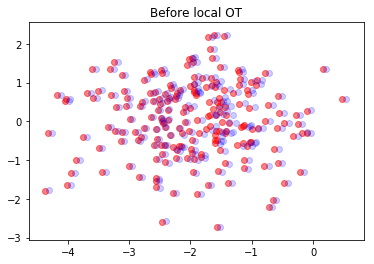

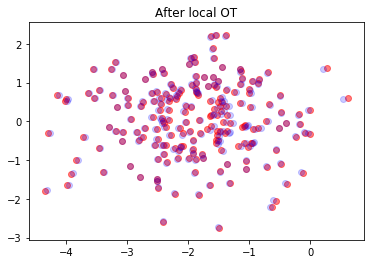

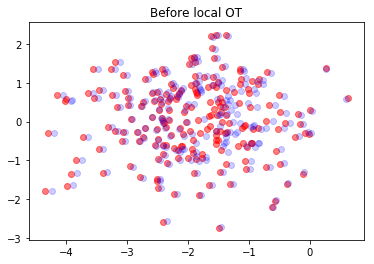

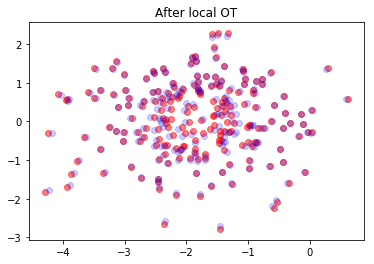

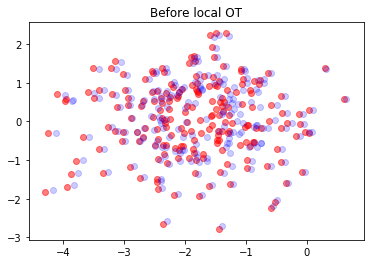

...

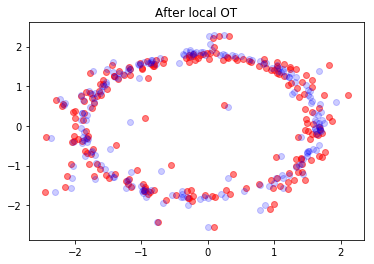

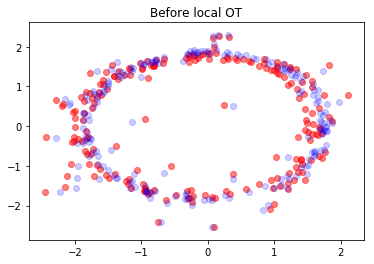

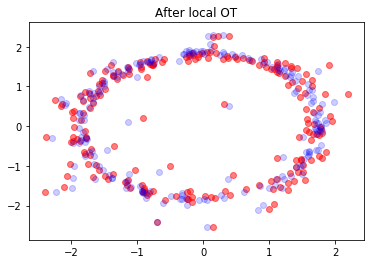

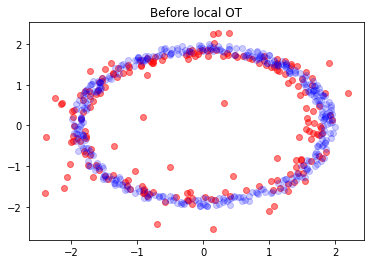

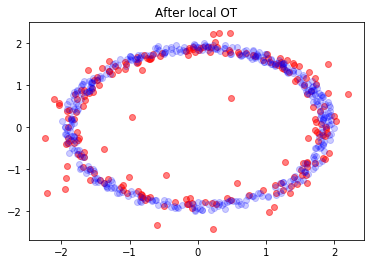

done


In [89]:
K = 30
Maxiter = 100
tol = 1e-2

Nx = len(x)
Ny = len(y) 
a_maps = K*[0]
b_maps = K*[0]

# #Initialize intermediary distributions with random selections for x
# x_K = np.array([y[np.random.randint(0,Ny)] for i in range(Nx)])
# mu = []
# mu.append(x)
# for k in range(1,K):
#     z = (1-k/K)*x+(k/K)*x_K
#     mu.append(z)
# mu.append(y)

#Initialize intermediary distributions both from x and y
x_K, y_0 = idx_choice(x,y)
mu = []
mu.append(x)
for k in range(1,K):
    z0k = (1-k/K)*x+(k/K)*x_K
    rdcx = np.random.choice(np.arange(Nx),int(Nx*(1-k/K)),replace=False)
    zx = z0k[rdcx]
    zKk = (1-k/K)*y_0+(k/K)*y
    rdcy = np.random.choice(np.arange(Ny),int(Ny*k/K),replace=False)
    zy = zKk[rdcy]
    z = np.concatenate([zx,zy])
    mu.append(z)
mu.append(y)
    

for niter in range(Maxiter):
    print(niter/Maxiter * 100)#debug
    x_Kold=x_K
    #solve local OT's
    z = x
    for k in range(1,K+1):
#         #plot before transport
#         bins = 35
#         plt.hist(z,density=True, bins=bins, color='red', alpha = 0.5);
#         plt.hist(mu[k],density=True, bins=bins, color='blue', alpha = 0.5);
        plt.scatter(z[:,0],z[:,1], color='red', alpha = 0.5);
        plt.scatter(mu[k][:,0],mu[k][:,1], color='blue', alpha = 0.2);
        plt.title('Before local OT')
        plt.draw()
        plt.show()
        
        #solve local transport problem
        Tloc,a,b = local_ot(z,mu[k],Niter=100)
        
        #plot after transport
#         bins = 35
#         plt.hist(Tloc,density=True, bins=bins, color='red', alpha = 0.5);
#         plt.hist(mu[k],density=True, bins=bins, color='blue', alpha = 0.5);
        plt.scatter(Tloc[:,0],Tloc[:,1], color='red', alpha = 0.5);
        plt.scatter(mu[k][:,0],mu[k][:,1], color='blue', alpha = 0.2);
        plt.title('After local OT')
        plt.draw()
        plt.show()
        
        a_maps[k-1] = a
        b_maps[k-1] = b
        z = Tloc
    x_K = z
    if (1/Nx)*la.norm(x_K-x_Kold,2)<tol:
        break
    #update intermediate distributions
    for k in range(1,K):
        mu[k] = (1-k/K)*x+(k/K)*x_K

print('done')

In [65]:
a_maps

[array([-0.03008915,  0.07833687,  0.1265522 , -0.04854289, -0.15368078,
         0.57292706,  1.17501369, -0.01085413,  0.00233698]),
 array([-0.02556904,  0.0654047 ,  0.15202215, -0.03565918, -0.09996498,
         0.39658729,  0.91800079, -0.02067183,  0.04753754]),
 array([-0.03453664,  0.09188035,  0.1089404 , -0.04449053, -0.17705194,
         0.85927111,  1.26901817, -0.03183507,  0.05382228]),
 array([-0.01174993,  0.06064926,  0.17256342, -0.01801265,  0.01806681,
        -0.10587343,  0.52201895,  0.00116436,  0.00171321]),
 array([-3.24698206e-02,  4.18408908e-02,  1.09187398e-01, -1.22383746e-02,
         1.82682573e-03,  1.91228916e-01,  5.46643634e-01,  5.33196720e-04,
         1.39133866e-03]),
 array([-0.00415328,  0.05508523,  0.0884413 , -0.0173051 , -0.04673458,
         0.40706274,  0.71978852, -0.00702059,  0.00101159]),
 array([-0.02598852,  0.0565416 ,  0.09142866, -0.01422672, -0.02564225,
         0.29774306,  0.59639063, -0.00460458, -0.00169195]),
 array([-0.

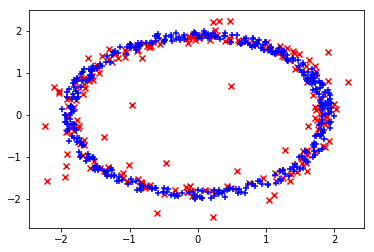

In [90]:
plt.scatter(x_K[:,0],x_K[:,1], color='red', marker = 'x');
plt.scatter(y[:,0],y[:,1], color='blue', marker = '+');

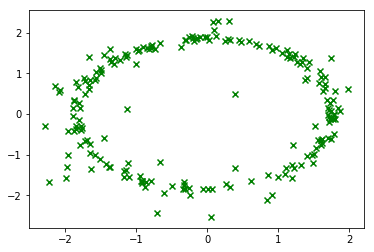

In [96]:
plt.scatter(mu[29][:,0],mu[29][:,1], color='green', marker = 'x');

## Packaged version

In [ ]:
def sot(x,y,K=10,tol=1e-1,Maxiter=50):
    Nx = len(x)
    Ny = len(y) 
    c_maps = K*[0]
    a_maps = K*[0]
    b_maps = K*[0]
    #Initialize intermediary distributions
    x_K = np.array([y[np.random.randint(0,Ny)] for i in range(Nx)])
    mu = []
    mu.append(x)
    for k in range(1,K):
        z = (1-k/K)*x+(k/K)*x_K
        mu.append(z)
    mu.append(y)
    
#     #plots
#     plt.figure(figsize=(20, 4))
#     for i in range(K+1):
#         plt.subplot(1, K+1, i+1)
#         plt.scatter(mu[i],np.zeros_like(mu[i]))
#     plt.draw()
#     plt.show()
    
    for niter in range(Maxiter):
        print(niter/Maxiter * 100)#debug
        x_Kold=x_K
        #solve local OT's
        z = x
        for k in range(1,K+1):
            Tloc,c,a,b = local_ot2(z,mu[k])
            c_maps[k-1] = c
            a_maps[k-1] = a
            b_maps[k-1] = b
            z = Tloc
        x_K = z
        if (1/Nx)*np.linalg.norm(x_K-x_Kold,2)<tol:
            break
        #update intermediate distributions
        for k in range(1,K):
            mu[k] = (1-k/K)*x+(k/K)*x_K
        
#         #plots
#         plt.figure(figsize=(20, 4))
#         for i in range(K+1):
#             plt.subplot(1, K+1, i+1)
#             plt.scatter(mu[i],np.zeros_like(mu[i]))
#         plt.draw()
#         plt.show()
        
    return(x_K, c_maps, a_maps, b_maps)

In [ ]:
Txa,c,a,b = sot(x,y)

In [ ]:
#plots
bins = 35
plt.hist(Txa,density=True, bins=bins, color='red', alpha = 0.5);
plt.hist(y,density=True, bins=bins, color='blue', alpha = 0.5);

In [ ]:
plt.scatter(Txa,np.zeros_like(Txa),color='red',alpha = 0.3);
plt.scatter(y,np.zeros_like(y), color='blue',alpha = 0.15);
# plt.scatter(x,np.zeros_like(x), color='green',alpha = 0.3);

In [ ]:
index = np.argsort(x)
u = Txa-x
plt.plot(x[index],u[index]);

In [ ]:
sumb = [np.sum([b[i][k] for i in range(len(b))]) for k in range(len(b[0]))]

In [ ]:
#Grid
m = min(min(x),min(y))
M = max(max(x),max(y))
NumKnots = 5
delta = (M-m)/(NumKnots-1)
g = np.array([m+delta*i for i in range(NumKnots)])
#Splines
def F1(z):
    if z<0:
        return 0
    elif z>1:
        return z-1/2
    else:
        return z**2/2
def F2(z):
    if z<0:
        return 0
    elif z>1:
        return z-2/3
    else:
        return z**3/3
def DF1(z):
    if z<0:
        return 0
    elif z>1:
        return 1
    else:
        return z
def DF2(z):
    if z<0:
        return 0
    elif z>1:
        return 1
    else:
        return z**2
def D2F1(z):
    if z<0:
        return 0
    elif z>1:
        return 0
    else:
        return 1
def D2F2(z):
    if z<0:
        return 0
    elif z>1:
        return 0
    else:
        return 2*z 
f = []
Df = []
D2f = []
f.append(lambda z: 1)
f.append(lambda z: z)
Df.append(lambda z: 0)
Df.append(lambda z: 1)
D2f.append(lambda z: 0)
D2f.append(lambda z: 0)
for t in range(NumKnots-1):
    f.append(lambda z, tl=t: F1((z-g[tl])/(g[tl+1]-g[tl])))
    f.append(lambda z, tl=t: F2((z-g[tl])/(g[tl+1]-g[tl])))
    Df.append(lambda z, tl=t: (1/(g[tl+1]-g[tl]))*DF1((z-g[tl])/(g[tl+1]-g[tl])))
    Df.append(lambda z, tl=t: (1/(g[tl+1]-g[tl]))*DF2((z-g[tl])/(g[tl+1]-g[tl])))
    D2f.append(lambda z, tl=t: (1/(g[tl+1]-g[tl])**2)*D2F1((z-g[tl])/(g[tl+1]-g[tl])))
    D2f.append(lambda z, tl=t: (1/(g[tl+1]-g[tl])**2)*D2F2((z-g[tl])/(g[tl+1]-g[tl])))
T = 2*NumKnots

In [ ]:
gtest = lambda z: np.sum([sumb[k]*f[k](z) for k in range(len(f))])

In [ ]:
zs = np.arange(-6,6,14/20)
plt.plot(zs,[gtest(zs[k]) for k in range(len(zs))])